# Install pkgs

**Note:** This is training notebook only. Inference ain't included in . 
Anybody who wants to use this notebook for inference purposes is most welcome.

In [1]:
import os
import shutil
import numpy as np
from pathlib import Path
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchinfo
from torch.utils.tensorboard import SummaryWriter
import zarr, copick
from tqdm import tqdm
import napari
import mlflow
import mlflow.pytorch
from copick_utils.segmentation import segmentation_from_picks
import copick_utils.writers.write as write
from collections import defaultdict
import matplotlib.pyplot as plt
import pandas as pd
import gc
import concurrent.futures
import optuna, optunahub
from optuna.visualization import plot_slice, plot_param_importances
import json
import copy
import random
from sklearn.cluster import DBSCAN

gc.enable()

In [2]:
torch._dynamo.config.cache_size_limit = 64
torch.backends.cudnn.benchmark = True

In [3]:
notebook_number = '20250202_02'

In [4]:
path = '/media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/'
output_path = path + 'output/'

In [5]:
# Make a copick project

config_blob = """{
    "name": "czii_cryoet_mlchallenge_2024",
    "description": "2024 CZII CryoET ML Challenge training data.",
    "version": "1.0.0",

    "pickable_objects": [
        {
            "name": "apo-ferritin",
            "is_particle": true,
            "pdb_id": "4V1W",
            "label": 1,
            "color": [  0, 117, 220, 128],
            "radius": 60,
            "map_threshold": 0.0418
        },
        {
            "name": "beta-galactosidase",
            "is_particle": true,
            "pdb_id": "6X1Q",
            "label": 2,
            "color": [ 76,   0,  92, 128],
            "radius": 90,
            "map_threshold": 0.0578
        },
        {
            "name": "ribosome",
            "is_particle": true,
            "pdb_id": "6EK0",
            "label": 3,
            "color": [  0,  92,  49, 128],
            "radius": 150,
            "map_threshold": 0.0374
        },
        {
            "name": "thyroglobulin",
            "is_particle": true,
            "pdb_id": "6SCJ",
            "label": 4,
            "color": [ 43, 206,  72, 128],
            "radius": 130,
            "map_threshold": 0.0278
        },
        {
            "name": "virus-like-particle",
            "is_particle": true,
            "label": 5,
            "color": [255, 204, 153, 128],
            "radius": 135,
            "map_threshold": 0.201
        }
    ],

    "overlay_root": "/media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/output/overlay",

    "overlay_fs_args": {
        "auto_mkdir": true
    },

    "static_root": "/media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/train/static"
}"""

copick_config_path = path + "output/copick.config"
output_overlay = path + "output/overlay"

with open(copick_config_path, "w") as f:
    f.write(config_blob)
    
# Update the overlay
# Define source and destination directories
source_dir = path + 'train/overlay'
destination_dir = path + 'output/overlay'

# Walk through the source directory
for root, dirs, files in os.walk(source_dir):
    # Create corresponding subdirectories in the destination
    relative_path = os.path.relpath(root, source_dir)
    target_dir = os.path.join(destination_dir, relative_path)
    os.makedirs(target_dir, exist_ok=True)
    
    # Copy and rename each file
    for file in files:
        if file.startswith("curation_0_"):
            new_filename = file
        else:
            new_filename = f"curation_0_{file}"
            
        
        # Define full paths for the source and destination files
        source_file = os.path.join(root, file)
        destination_file = os.path.join(target_dir, new_filename)
        
        # Copy the file with the new name
        shutil.copy2(source_file, destination_file)
        print(f"Copied {source_file} to {destination_file}")

Copied /media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/train/overlay/ExperimentRuns/TS_5_4/Picks/apo-ferritin.json to /media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/output/overlay/ExperimentRuns/TS_5_4/Picks/curation_0_apo-ferritin.json
Copied /media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/train/overlay/ExperimentRuns/TS_5_4/Picks/beta-amylase.json to /media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/output/overlay/ExperimentRuns/TS_5_4/Picks/curation_0_beta-amylase.json
Copied /media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/train/overlay/ExperimentRuns/TS_5_4/Picks/beta-galactosidase.json to /media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/output/overlay/ExperimentRuns/TS_5_4/Picks/curation_0_beta-galactosidase.json
Copied /media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/train/overlay/ExperimentRuns/TS_5_4/Picks/ribosome.json to /media

# Prepare the dataset
## 1. Get copick root

In [6]:
root = copick.from_file(copick_config_path)

copick_user_name = "copickUtils"
copick_segmentation_name = "paintedPicks"
voxel_size = 10
#tomo_type = "denoised"

## 2. Generate multi-class segmentation masks from picks, and saved them to the copick overlay directory (one-time)

In [7]:
root

CopickRoot(user_id=None, len(pickable_objects)=None, len(runs)=None) at 0x74bf863de240

In [8]:
# Just do this once
generate_masks = True

if generate_masks:
    target_objects = defaultdict(dict)
    for object in root.pickable_objects:
        if object.is_particle:
            target_objects[object.name]['label'] = object.label
            target_objects[object.name]['radius'] = object.radius


    for run in tqdm(root.runs):
        tomo = run.get_voxel_spacing(voxel_size)
        for tomogram in tomo.tomograms:
            tomo_type = tomogram.tomo_type
            if tomo_type != 'denoised':
                continue
            image = tomogram.numpy()
            target = np.zeros(image.shape, dtype=np.uint8)
            for pickable_object in root.pickable_objects:
                pick = run.get_picks(object_name=pickable_object.name, user_id='curation')
                if len(pick):
                    target = segmentation_from_picks.from_picks(pick[0],
                                                                target,
                                                                target_objects[pickable_object.name]['radius'],
                                                                target_objects[pickable_object.name]['label']
                                                               )
            write.segmentation(run, target, copick_user_name, name=copick_segmentation_name)

100%|█████████████████████████████████████████████| 7/7 [00:04<00:00,  1.45it/s]


## 3. Get tomograms and their segmentaion masks (from picks) arrays

In [9]:
train_label_experiment_folders_path = '/media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/' + 'train/overlay/ExperimentRuns/'

In [10]:
class_ids = {
    'apo-ferritin': 1,
    'beta-galactosidase': 2,
    'ribosome': 3,
    'thyroglobulin': 4,
    'virus-like-particle': 5,
}

In [11]:
particle_radius = {
    'apo-ferritin': 60,
    'beta-galactosidase': 90,
    'ribosome': 150,
    'thyroglobulin': 130,
    'virus-like-particle': 135,
}

In [12]:
def create_labels_df(experiment):
    labels_dict = {}
    
    particle_types_dict = {}
    
    with open(f'{train_label_experiment_folders_path}{experiment}/Picks/apo-ferritin.json') as f:
        loaded_json = json.loads(f.read())
    particle_types_dict['apo-ferritin'] = loaded_json
    
    with open(f'{train_label_experiment_folders_path}{experiment}/Picks/beta-galactosidase.json') as f:
        loaded_json = json.loads(f.read())
    particle_types_dict['beta-galactosidase'] = loaded_json
    
    with open(f'{train_label_experiment_folders_path}{experiment}/Picks/ribosome.json') as f:
        loaded_json = json.loads(f.read())
    particle_types_dict['ribosome'] = loaded_json
    
    with open(f'{train_label_experiment_folders_path}{experiment}/Picks/thyroglobulin.json') as f:
        loaded_json = json.loads(f.read())
    particle_types_dict['thyroglobulin'] = loaded_json
    
    with open(f'{train_label_experiment_folders_path}{experiment}/Picks/virus-like-particle.json') as f:
        loaded_json = json.loads(f.read())
    particle_types_dict['virus-like-particle'] = loaded_json
    
    labels_dict[experiment] = particle_types_dict

    experiment_list = []
    particle_type_list = []
    x_list = []
    y_list = []
    z_list = []
    r_list = []
    class_id_list = []
    #print(experiment)
    #print(len(labels_dict[experiment]['apo-ferritin']['points']))
    #print(type(labels_dict[experiment]['apo-ferritin']['points']))
    #print(labels_dict[experiment]['apo-ferritin']['points'][0])

    for key in labels_dict[experiment].keys():
        #print(labels_dict[experiment][key])
        #print(labels_dict[experiment][key]['pickable_object_name'])
        for i in range(len(labels_dict[experiment][key]['points'])):
            experiment_list.append(labels_dict[experiment][key]['run_name'])
            particle_type_list.append(labels_dict[experiment][key]['pickable_object_name'])
            x_list.append(labels_dict[experiment][key]['points'][i]['location']['x']/10.012444537618887)
            y_list.append(labels_dict[experiment][key]['points'][i]['location']['y']/10.012444196428572)
            z_list.append(labels_dict[experiment][key]['points'][i]['location']['z']/10.012444196428572)
            r_list.append(particle_radius[key]/10.012444)
            class_id_list.append(class_ids[key])

    labels_df = pd.DataFrame({'experiment':experiment_list, 'particle_type':particle_type_list, 'x':x_list, 'y':y_list, 'z':z_list, 'radius':r_list, 'label':class_id_list})
    
    return labels_df

In [13]:
data_dicts = []
for run in tqdm(root.runs):
    tomo = run.get_voxel_spacing(voxel_size)#.get_tomograms(tomo_type)[0].numpy()
    labels_df = create_labels_df(run.name)
    for tomogram in tomo.tomograms:
        tomo_type = tomogram.tomo_type
        if tomo_type != 'denoised':
            continue
        image = tomogram.numpy()
        segmentation = run.get_segmentations(name=copick_segmentation_name, user_id=copick_user_name, voxel_size=voxel_size, is_multilabel=True)[0].numpy()
        data_dicts.append({"tomo_type":tomo_type, "image": image, "label": segmentation, "label_df": labels_df})
    
print(np.unique(data_dicts[0]['label']))

100%|█████████████████████████████████████████████| 7/7 [00:03<00:00,  2.30it/s]


[0 1 2 3 4 5]


In [14]:
data_dicts[0].keys()

dict_keys(['tomo_type', 'image', 'label', 'label_df'])

In [15]:
data_dicts[0]['label'].shape

(184, 630, 630)

In [16]:
len(data_dicts)

7

In [17]:
data_dicts[0].keys()

dict_keys(['tomo_type', 'image', 'label', 'label_df'])

In [18]:
data_dicts[0]['label_df']

,experiment,particle_type,x,y,z,radius,label
0,TS_5_4,apo-ferritin,46.793168,590.855328,60.341610,5.992543,1
1,TS_5_4,apo-ferritin,566.764088,111.296900,56.436569,5.992543,1
2,TS_5_4,apo-ferritin,573.736911,104.786801,65.289952,5.992543,1
3,TS_5_4,apo-ferritin,587.345975,112.394934,57.883968,5.992543,1
4,TS_5_4,apo-ferritin,465.587298,126.791918,80.940176,5.992543,1
...,...,...,...,...,...,...,...
125,TS_5_4,virus-like-particle,263.326203,420.974132,96.421012,13.483221,5
126,TS_5_4,virus-like-particle,313.349651,356.801989,37.245052,13.483221,5
127,TS_5_4,virus-like-particle,329.003870,302.370125,67.323222,13.483221,5
128,TS_5_4,virus-like-particle,299.396016,494.206799,116.792162,13.483221,5


## 4. Visualize the tomogram and painted segmentation from ground-truth picks

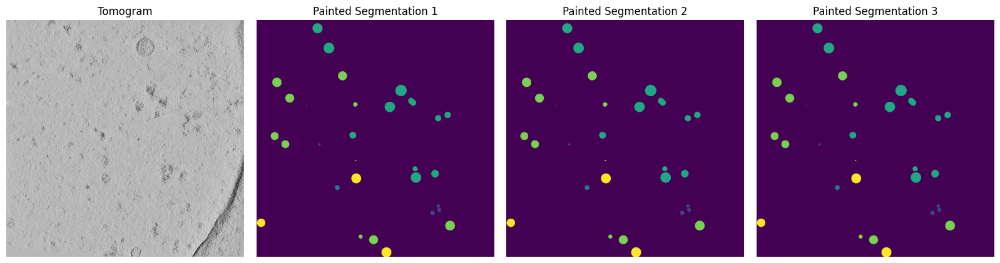

In [19]:
# Create figure
fig, axes = plt.subplots(1, 4, figsize=(16, 4))  # Adjust figsize to control spacing

# Image 1
axes[0].imshow(data_dicts[0]['image'][100], cmap='gray')
axes[0].set_title('Tomogram')
axes[0].axis('off')

# Image 2
axes[1].imshow(data_dicts[0]['label'][100], cmap='viridis')
axes[1].set_title('Painted Segmentation 1')
axes[1].axis('off')

# Image 3
axes[2].imshow(data_dicts[0]['label'][100], cmap='viridis')
axes[2].set_title('Painted Segmentation 2')
axes[2].axis('off')

# Image 4
axes[3].imshow(data_dicts[0]['label'][100], cmap='viridis')
axes[3].set_title('Painted Segmentation 3')
axes[3].axis('off')

# Reduce spacing
plt.subplots_adjust(wspace=0.05)  # Reduce horizontal space between images
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)  # Further minimize padding

plt.show()

# Simulated data prep

In [20]:
simulated_data_path = '../../czii_downloaded_data/simulated_training_data/'

In [21]:
simulated_experiments_list = [f for f in os.listdir(simulated_data_path) if 'TS_' in f]
simulated_experiments_list

['TS_26',
 'TS_13',
 'TS_22',
 'TS_17',
 'TS_1',
 'TS_24',
 'TS_19',
 'TS_4',
 'TS_6',
 'TS_23',
 'TS_2',
 'TS_16',
 'TS_14',
 'TS_20',
 'TS_18',
 'TS_0',
 'TS_21',
 'TS_3',
 'TS_9',
 'TS_7',
 'TS_10',
 'TS_11',
 'TS_25',
 'TS_12',
 'TS_15',
 'TS_5',
 'TS_8']

In [22]:
particle_info = {
    "apo-ferritin": {"label": 1, "radius": 60},
    "beta-galactosidase": {"label": 2, "radius": 90},
    "ribosome": {"label": 3, "radius": 150},
    "thyroglobulin": {"label": 4, "radius": 130},
    "virus-like-particle": {"label": 5, "radius": 135}
}

In [23]:
def create_masks(image, locations_df):
    shape = image.shape
    volume = np.zeros(shape, dtype=np.uint8)

    # Extract (z, y, x) coordinates and radius as NumPy arrays
    centers = locations_df[['z', 'y', 'x']].values
    radii = locations_df['radius'].values
    intensities = locations_df['label'].values

    # Create coordinate grids
    z, y, x = np.ogrid[:shape[0], :shape[1], :shape[2]]

    # Compute mask for all locations at once
    for idx in range(len(centers)):
        center = centers[idx]
        radius = radii[idx]
        intensity = intensities[idx]

        # Create a mask using broadcasting
        mask = (x - center[2])**2 + (y - center[1])**2 + (z - center[0])**2 <= radius**2
        volume[mask] = intensity  # Assign intensity value

    return volume

In [24]:
'''
for i in tqdm(range(len(data_dicts))):
    data_dicts[i]['label'] = create_masks(data_dicts[i]['image'], data_dicts[i]['label_df'])
'''

"\nfor i in tqdm(range(len(data_dicts))):\n    data_dicts[i]['label'] = create_masks(data_dicts[i]['image'], data_dicts[i]['label_df'])\n"

In [25]:
particle_name_dict = {
    'ferritin':'apo-ferritin',
    'galacto':'beta-galactosidase',
    'ribosome':'ribosome',
    'thyro':'thyroglobulin',
    'vlp':'virus-like-particle'
}

In [26]:
def process_experiment(experiment):
    """Process a single experiment in parallel"""
    # Load tomogram data
    tomogram_path = f'{simulated_data_path}{experiment}/Reconstructions/VoxelSpacing10.000/Tomograms/100/{experiment}.zarr'
    tomogram = zarr.open(tomogram_path, mode='r')[0].__array__()
    
    location_dfs_list = []
    annotations_base = f'{simulated_data_path}{experiment}/Reconstructions/VoxelSpacing10.000/Annotations/'
    
    # Process location files
    for location_folder in os.listdir(annotations_base):
        location_dir = os.path.join(annotations_base, location_folder)
        for location_file in os.listdir(location_dir):
            if 'orientedpoint.ndjson' not in location_file:
                continue
                
            # Determine particle type
            particle_type = None
            for key in particle_name_dict.keys():
                if key in location_file:
                    particle_type = particle_name_dict[key]
                    break
            if not particle_type:
                continue
                
            # Process NDJSON file
            label = particle_info[particle_type]['label']
            radius = particle_info[particle_type]['radius']
            file_path = os.path.join(location_dir, location_file)
            
            location_df = pd.read_json(file_path, lines=True)
            location_df['x'] = location_df['location'].map(lambda x: x['x'])
            location_df['y'] = location_df['location'].map(lambda x: x['y'])
            location_df['z'] = location_df['location'].map(lambda x: x['z'])
            location_df['label'] = label
            location_df['radius'] = radius / 10.012444
            location_df['particle_type'] = particle_type
            
            location_dfs_list.append(location_df)
    
    # Create mask and return result
    if location_dfs_list:
        all_particle_locations_df = pd.concat(location_dfs_list, ignore_index=True)
        mask_image = create_masks(tomogram, all_particle_locations_df)
        all_particle_locations_df['experiment'] = experiment
        label_df = all_particle_locations_df[['experiment', 'particle_type', 'x', 'y', 'z', 'radius', 'label']]
        return {"tomo_type": 'Unknown', "image": tomogram, "label": mask_image, "label_df": label_df}
    return None

def append_simulation_data():
    global data_dicts
    max_workers = os.cpu_count() // 2  # Use half the available cores to prevent memory issues
    
    with concurrent.futures.ProcessPoolExecutor(max_workers=max_workers) as executor:
        # Submit all experiments for processing
        futures = [executor.submit(process_experiment, exp) for exp in simulated_experiments_list]
        
        # Collect results as they complete
        for future in tqdm(concurrent.futures.as_completed(futures), 
                         total=len(simulated_experiments_list),
                         desc="Processing experiments"):
            result = future.result()
            if result:
                data_dicts.append(result)

In [27]:
#append_simulation_data()

In [28]:
len(data_dicts)

7

In [29]:
data_dicts[-1]['label_df']

,experiment,particle_type,x,y,z,radius,label
0,TS_99_9,apo-ferritin,606.491649,403.298128,71.478950,5.992543,1
1,TS_99_9,apo-ferritin,596.003501,422.295787,112.320326,5.992543,1
2,TS_99_9,apo-ferritin,584.035395,506.041272,67.804922,5.992543,1
3,TS_99_9,apo-ferritin,47.226529,562.561737,57.995429,5.992543,1
4,TS_99_9,apo-ferritin,56.380537,559.791385,67.731713,5.992543,1
...,...,...,...,...,...,...,...
182,TS_99_9,virus-like-particle,200.755769,474.671110,105.576419,13.483221,5
183,TS_99_9,virus-like-particle,224.127883,430.470614,95.835540,13.483221,5
184,TS_99_9,virus-like-particle,80.327037,580.990504,57.877276,13.483221,5
185,TS_99_9,virus-like-particle,419.300999,552.769922,85.710240,13.483221,5


## 5. Prepare dataloaders

In [30]:
from monai.data import DataLoader, Dataset, CacheDataset, decollate_batch
from monai.transforms import (
    Compose,
    EnsureChannelFirstd, 
    Orientationd,  
    AsDiscrete,  
    RandFlipd,
    NormalizeIntensityd,
    RandCropByLabelClassesd,
    RandGaussianNoised,
    RandAdjustContrastd,
    MapTransform,
    RandZoomd,
    RandRotate90d
)
from monai.networks.nets import UNet, SwinUNETR
from monai.losses import DiceLoss, FocalLoss, TverskyLoss
from monai.metrics import DiceMetric, ConfusionMatrixMetric
import torchio as tio

In [31]:
exp_names_list = []
for i in range(len(data_dicts)):
    exp_name = data_dicts[i]['label_df']['experiment'][0]
    exp_names_list.append(exp_name)
exp_names_sr = pd.Series(exp_names_list)
unique_exp_names = exp_names_sr.unique()
unique_exp_names

array(['TS_5_4', 'TS_69_2', 'TS_6_4', 'TS_6_6', 'TS_73_6', 'TS_86_3',
       'TS_99_9'], dtype=object)

In [32]:
len(unique_exp_names)

7

In [33]:
data_dicts_copy = copy.deepcopy(data_dicts)
len(data_dicts_copy)

7

In [34]:
num_classes = 6 # 1 background + 5 particles
my_num_samples = 16
train_batch_size = 1
val_batch_size = 1
loader_workers = 8
cube_size = 160

In [35]:
# Define TorchIO transforms (applies to both image & label)
torchio_transforms = tio.Compose([
    #tio.RandomElasticDeformation(num_control_points=7, max_displacement=3, image_interpolation='linear', locked_borders=2, p=0.5),  # Elastic deformation
    tio.RandomNoise(std=0.1, include=["image"], p=0.2),  # Noise ONLY on the image
    #tio.RandomGhosting(num_ghosts=2, axes=(0, 1), include=["image"], p=0.5),  # Ghosting ONLY on the image
    tio.RandomBiasField(include=['image'], p=0.2, coefficients=0.3, order=2),
    tio.RandomGamma(include=['image'], p=0.5)
])

In [36]:
class TorchIOTransform(MapTransform):
    """
    Applies TorchIO augmentations to both image and label.
    Ensures that both undergo the same transformations for segmentation tasks.
    """
    def __init__(self, keys, torchio_transform):
        super().__init__(keys)
        self.torchio_transform = torchio_transform

    def __call__(self, data):
        # Ensure the image tensor is 4D (C, H, W, D)
        image = data["image"]
        label = data["label"]

        if image.ndim == 5:  # (B, C, H, W, D) -> Remove batch dimension
            image = image.squeeze(0)
            label = label.squeeze(0)

        # Wrap image & label as a TorchIO Subject (keeps transformations consistent)
        subject = tio.Subject(
            image=tio.ScalarImage(tensor=image),  # Ensure 4D (C, H, W, D)
            label=tio.LabelMap(tensor=label)  # Ensure 4D (C, H, W, D)
        )

        # Apply TorchIO transformations
        transformed = self.torchio_transform(subject)

        # Convert back to MONAI format
        data["image"] = transformed.image.data  # Keep it 4D
        data["label"] = transformed.label.data  # Keep it 4D
        return data

In [37]:
# Non-random transforms to be cached
non_random_transforms = Compose([
    EnsureChannelFirstd(keys=["image", "label"], channel_dim="no_channel"),
    NormalizeIntensityd(keys="image"),
    Orientationd(keys=["image", "label"], axcodes="RAS"),
])

# Random transforms to be applied during training
random_transforms = Compose([
    RandCropByLabelClassesd(
        keys=["image", "label"],
        label_key="label",
        spatial_size=[cube_size, cube_size, cube_size],
        num_classes=num_classes,
        num_samples=my_num_samples,
        allow_missing_keys=True
    ),
    RandFlipd(keys=["image", "label"], prob=0.5, spatial_axis=0),
    RandFlipd(keys=["image", "label"], prob=0.5, spatial_axis=1),
    RandFlipd(keys=["image", "label"], prob=0.5, spatial_axis=2),
    RandAdjustContrastd(keys=["image"], prob=0.5, gamma=(0.7, 1.3)),  # Random contrast change
    RandRotate90d(keys=["image", "label"], prob=0.5, spatial_axes=[0, 2]),
    #RandZoomd(keys=['image', 'label'], prob=1),
    TorchIOTransform(keys=["image", "label"], torchio_transform=torchio_transforms),  # Apply TorchIO
])

In [38]:
# Validation transforms
val_transforms = Compose([
    RandCropByLabelClassesd(
        keys=["image", "label"],
        label_key="label",
        spatial_size=[cube_size, cube_size, cube_size],
        num_classes=num_classes,
        num_samples=my_num_samples,  # Use 1 to get a single, consistent crop per image
        allow_missing_keys=True
    ),
])

## Model setup

In [39]:
"""
Derived from:
https://github.com/cellcanvas/album-catalog/blob/main/solutions/copick/compare-picks/solution.py
"""

import numpy as np
import pandas as pd

from scipy.spatial import KDTree


class ParticipantVisibleError(Exception):
    pass


def compute_metrics(reference_points, reference_radius, candidate_points):
    num_reference_particles = len(reference_points)
    num_candidate_particles = len(candidate_points)

    if len(reference_points) == 0:
        return 0, num_candidate_particles, 0

    if len(candidate_points) == 0:
        return 0, 0, num_reference_particles

    ref_tree = KDTree(reference_points)
    candidate_tree = KDTree(candidate_points)
    raw_matches = candidate_tree.query_ball_tree(ref_tree, r=reference_radius)
    matches_within_threshold = []
    for match in raw_matches:
        matches_within_threshold.extend(match)
    # Prevent submitting multiple matches per particle.
    # This won't be be strictly correct in the (extremely rare) case where true particles
    # are very close to each other.
    matches_within_threshold = set(matches_within_threshold)
    tp = int(len(matches_within_threshold))
    fp = int(num_candidate_particles - tp)
    fn = int(num_reference_particles - tp)
    return tp, fp, fn


def score(
        solution: pd.DataFrame,
        submission: pd.DataFrame,
        row_id_column_name: str,
        distance_multiplier: float,
        beta: int) -> float:
    '''
    F_beta
      - a true positive occurs when
         - (a) the predicted location is within a threshold of the particle radius, and
         - (b) the correct `particle_type` is specified
      - raw results (TP, FP, FN) are aggregated across all experiments for each particle type
      - f_beta is calculated for each particle type
      - individual f_beta scores are weighted by particle type for final score
    '''

    particle_radius = {
        'apo-ferritin': 60,
        'beta-amylase': 65,
        'beta-galactosidase': 90,
        'ribosome': 150,
        'thyroglobulin': 130,
        'virus-like-particle': 135,
    }

    weights = {
        'apo-ferritin': 1,
        'beta-amylase': 0,
        'beta-galactosidase': 2,
        'ribosome': 1,
        'thyroglobulin': 2,
        'virus-like-particle': 1,
    }

    particle_radius = {k: v * distance_multiplier for k, v in particle_radius.items()}

    # Filter submission to only contain experiments found in the solution split
    split_experiments = set(solution['experiment'].unique())
    submission = submission.loc[submission['experiment'].isin(split_experiments)]

    # Only allow known particle types
    if not set(submission['particle_type'].unique()).issubset(set(weights.keys())):
        raise ParticipantVisibleError('Unrecognized `particle_type`.')

    assert solution.duplicated(subset=['experiment', 'x', 'y', 'z']).sum() == 0
    assert particle_radius.keys() == weights.keys()

    results = {}
    for particle_type in solution['particle_type'].unique():
        results[particle_type] = {
            'total_tp': 0,
            'total_fp': 0,
            'total_fn': 0,
        }

    for experiment in split_experiments:
        for particle_type in solution['particle_type'].unique():
            reference_radius = particle_radius[particle_type]
            select = (solution['experiment'] == experiment) & (solution['particle_type'] == particle_type)
            reference_points = solution.loc[select, ['x', 'y', 'z']].values

            select = (submission['experiment'] == experiment) & (submission['particle_type'] == particle_type)
            candidate_points = submission.loc[select, ['x', 'y', 'z']].values

            if len(reference_points) == 0:
                reference_points = np.array([])
                reference_radius = 1

            if len(candidate_points) == 0:
                candidate_points = np.array([])

            tp, fp, fn = compute_metrics(reference_points, reference_radius, candidate_points)

            results[particle_type]['total_tp'] += tp
            results[particle_type]['total_fp'] += fp
            results[particle_type]['total_fn'] += fn

    aggregate_fbeta = 0.0
    for particle_type, totals in results.items():
        tp = totals['total_tp']
        fp = totals['total_fp']
        fn = totals['total_fn']

        precision = tp / (tp + fp) if tp + fp > 0 else 0
        recall = tp / (tp + fn) if tp + fn > 0 else 0
        fbeta = (1 + beta**2) * (precision * recall) / (beta**2 * precision + recall) if (precision + recall) > 0 else 0.0
        aggregate_fbeta += fbeta * weights.get(particle_type, 1.0)

    if weights:
        aggregate_fbeta = aggregate_fbeta / sum(weights.values())
    else:
        aggregate_fbeta = aggregate_fbeta / len(results)
    return aggregate_fbeta

In [40]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [41]:
class FBetaLoss(nn.Module):
    def __init__(self, beta=4, eps=1e-6, class_weights=None, enzyme_classes=5):
        super().__init__()
        self.beta = beta
        self.eps = eps
        self.enzyme_classes = enzyme_classes
        
        self.class_weights = class_weights or {
            'apo-ferritin': 1,
            'beta-galactosidase': 2,
            'ribosome': 1,
            'thyroglobulin': 2,
            'virus-like-particle': 1,
        }
        self.weight_tensor = torch.tensor(
            [self.class_weights[k] for k in self.class_weights.keys()],
            dtype=torch.float32
        )

    def forward(self, y_pred, y_true):
        # Convert y_true to proper format
        y_true = y_true.squeeze(1).long()  # Remove channel dim & ensure integer type
        
        y_pred_probs = F.softmax(y_pred, dim=1)
        y_pred_enzymes = y_pred_probs[:, 1:self.enzyme_classes+1, ...]
        
        # One-hot encoding with proper type handling
        y_true_onehot = F.one_hot(y_true, num_classes=6).permute(0, 4, 1, 2, 3).float()
        y_true_enzymes = y_true_onehot[:, 1:self.enzyme_classes+1, ...]

        tp = (y_pred_enzymes * y_true_enzymes).sum(dim=(2, 3, 4))
        fp = (y_pred_enzymes * (1 - y_true_enzymes)).sum(dim=(2, 3, 4))
        fn = ((1 - y_pred_enzymes) * y_true_enzymes).sum(dim=(2, 3, 4))

        precision = tp / (tp + fp + self.eps)
        recall = tp / (tp + fn + self.eps)
        beta2 = self.beta ** 2
        f_beta = (1 + beta2) * (precision * recall) / (beta2 * precision + recall + self.eps)

        weight_tensor = self.weight_tensor.to(y_pred.device)
        weighted_f_beta = f_beta * weight_tensor
        aggregate_f_beta = weighted_f_beta.sum(dim=1) / weight_tensor.sum()
        
        return 1 - aggregate_f_beta.mean()

In [42]:
class ParticleTverskyCrossEntropyLoss(nn.Module):
    def __init__(self, alpha=16/17, beta=1/17, ce_weight=0.2, tversky_weight=0.5, smooth=1e-6):
        """
        Args:
            particle_weights (torch.Tensor): Weights for 5 particles + background [0.0, 1.0, 2.0, 1.0, 2.0, 1.0]
            alpha: Tversky FP weight (prioritizes recall for beta=4)
            beta: Tversky FN weight
        """
        super().__init__()
        self.ce_weight = ce_weight
        self.tversky_weight = tversky_weight
        self.smooth = smooth
        self.alpha = alpha
        self.beta = beta

        particle_weights = torch.tensor([
            0.0,  # Background (weight=0)
            1.0,  # apo-ferritin
            2.0,  # beta-galactosidase (higher weight)
            1.0,  # ribosome
            2.0,  # thyroglobulin (higher weight)
            1.0   # virus-like-particle
        ], device='cuda')
        
        # Cross-Entropy with particle weights (background weight=0)
        self.ce = nn.CrossEntropyLoss(weight=particle_weights)
        self.register_buffer('class_weights', particle_weights)  # [6] tensor

    def forward(self, inputs, targets):
        # Ensure targets have the correct shape and dtype
        ce_loss = self.ce(inputs, targets.squeeze(1).long())
    
        # Tversky Loss (3D-compatible)
        num_classes = inputs.shape[1]
        probs = F.softmax(inputs, dim=1)
        targets_onehot = F.one_hot(targets.squeeze(1).long(), num_classes).permute(0, 4, 1, 2, 3).float()  # BCDHW
    
        # Flatten spatial dimensions (3D)
        probs_flat = probs.view(probs.size(0), num_classes, -1)  # [B,6,D*H*W]
        targets_flat = targets_onehot.view(targets_onehot.size(0), num_classes, -1)
    
        # Calculate TP/FP/FN (broadcasted across classes)
        tp = (probs_flat * targets_flat).sum(dim=2)  # [B,6]
        fp = (probs_flat * (1 - targets_flat)).sum(dim=2)
        fn = ((1 - probs_flat) * targets_flat).sum(dim=2)
    
        # Tversky index per class
        tversky = (tp + self.smooth) / (tp + self.alpha*fp + self.beta*fn + self.smooth)  # [B,6]
        tversky_loss = 1 - tversky
    
        # Apply class weights
        weighted_tversky = tversky_loss * self.class_weights  # [B,6]
        tversky_loss = weighted_tversky.mean()
    
        # Combined loss
        return self.ce_weight * ce_loss + self.tversky_weight * tversky_loss

In [43]:
class CombinedLoss(nn.Module):
    def __init__(self, lambda_fbeta=0.3, lambda_tversky=0.5, lambda_ce=0.2):
        super(CombinedLoss, self).__init__()
        self.fbeta_loss = FBetaLoss()
        self.wtversky_ce_loss = ParticleTverskyCrossEntropyLoss(ce_weight=lambda_ce, tversky_weight=lambda_tversky)

        self.lambda_fbeta = lambda_fbeta

    def forward(self, predictions, targets):
        """Compute combined loss over multiple anchors."""

        fbeta = self.fbeta_loss(predictions, targets)
        wtversky_ce = self.wtversky_ce_loss(predictions, targets)

        if torch.isnan(fbeta) or torch.isinf(fbeta):
            print(f"❌ NaN/Inf detected in fbeta loss function! fbeta Loss: {fbeta}")

        if torch.isnan(wtversky_ce) or torch.isinf(wtversky_ce):
            print(f"❌ NaN/Inf detected in wtversky_ce loss function! wtversky_ce Loss: {fbeta}")

        total_loss = fbeta * self.lambda_fbeta + wtversky_ce

        return total_loss

In [44]:
combined_loss_function = CombinedLoss()

In [45]:
class LF_beta_q_Loss(nn.Module):
    def __init__(self, beta=1.0, q=1.0, p=0.5):
        """
        Implements L_{Fβ,q} loss, which interpolates between F-beta loss and MAE loss.

        Args:
        - beta (float): Controls precision-recall balance (higher beta = more recall focus).
        - q (float): Controls robustness to label noise (0 < q ≤ 1).
        - p (float): Class balancing probability term (default: 0.5 for balanced classes).
        """
        super(LF_beta_q_Loss, self).__init__()
        self.beta = beta
        self.q = q
        self.p = p
        self.eps = 1e-7  # Small epsilon to prevent division by zero

    def forward(self, y_pred, y_true):
        """
        Compute the L_{Fβ,q} loss.

        Args:
        - y_pred: Model predictions (Sigmoid outputs, range 0-1) (B, C, D, H, W)
        - y_true: Ground truth binary masks (B, C, D, H, W)

        Returns:
        - Loss value (scalar)
        """
        # Ensure predictions are between a safe range
        y_pred = torch.clamp(y_pred, self.eps, 1 - self.eps)

        # First term: y * (1 - f(x;θ))^q / q
        term1 = y_true * ((1 - y_pred) / self.q).pow(self.q)

        # Second term: (1 - y) * (β^2 * p / (1 - p + f(x;θ)))^q
        term2 = (1 - y_true) * ((self.beta ** 2 * self.p) / (1 - self.p + y_pred)).pow(self.q)

        # Compute full loss (subtracting 1 ensures proper minimization)
        loss = term1 + term2 - 1

        return loss.mean()  # Return averaged loss over the batch

In [46]:
class_weights = [
    0,  # Background (weight=0)
    1,  # apo-ferritin
    2,  # beta-galactosidase
    1,  # ribosome
    2,  # thyroglobulin
    1,  # virus-like-particle
]

In [47]:
class WeightedFocalTverskyLoss(nn.Module):
    def __init__(
        self,
        class_weights,  # [background_weight=0, particle_weights...]
        alpha=0.2,
        beta=0.8,
        gamma=0.75,
        smooth=1e-6
    ):
        super().__init__()
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma
        self.smooth = smooth
        self.class_weights = torch.tensor(class_weights, dtype=torch.float32)

    def forward(self, preds, targets):
        # preds: (B, C, D, H, W) logits
        # targets: (B, C, D, H, W) one-hot encoded
        device = preds.device
        self.class_weights = self.class_weights.to(device)

        # Softmax for probabilities
        preds = torch.softmax(preds, dim=1)

        # Compute TP, FP, FN per class (B, C)
        tp = (preds * targets).sum(dim=(2, 3, 4))  # (B, C)
        fp = (preds * (1 - targets)).sum(dim=(2, 3, 4))
        fn = ((1 - preds) * targets).sum(dim=(2, 3, 4))

        # Tversky index per class (B, C)
        tversky = (tp + self.smooth) / (
            tp + self.alpha * fp + self.beta * fn + self.smooth
        )

        # Focal Tversky loss per class (B, C)
        focal_tversky = (1 - tversky) ** self.gamma

        # Apply class weights (background weight=0 is excluded)
        weighted_loss = focal_tversky * self.class_weights  # (B, C)

        # Sum over classes and average over batch
        total_loss = weighted_loss.sum(dim=1).mean()  # (1)

        return total_loss

In [48]:
weighted_focal_tversky_loss_function = WeightedFocalTverskyLoss(class_weights=class_weights)

In [49]:
#dice_loss_function = DiceLoss(include_background=True, to_onehot_y=True, softmax=True)  # softmax=True for multiclass
tversky_loss_function = TverskyLoss(include_background=True, to_onehot_y=True, softmax=True, alpha=16/17, beta=1/17)  # softmax=True for multiclass
dice_metric = DiceMetric(include_background=False, reduction="mean", ignore_empty=True)  # must use onehot for multiclass
recall_metric = ConfusionMatrixMetric(include_background=False, metric_name="recall", reduction="None")

In [50]:
post_pred = AsDiscrete(argmax=True, to_onehot=num_classes)
post_label = AsDiscrete(to_onehot=num_classes)

In [51]:
id_to_name = {1: "apo-ferritin", 
              #2: "beta-amylase",
              2: "beta-galactosidase", 
              3: "ribosome", 
              4: "thyroglobulin", 
              5: "virus-like-particle"}

In [52]:
classes = [1, 2, 3, 4, 5]

In [53]:
from typing import List, Tuple, Union
import cc3d

In [54]:
def extract_3d_patches_minimal_overlap(
    arrays: List[np.ndarray], patch_size: int, overlap: int = 48
) -> Tuple[List[np.ndarray], List[Tuple[int, int, int]]]:
    if not arrays or not isinstance(arrays, list):
        raise ValueError("Input must be a non-empty list of arrays")

    # Verify all arrays have the same shape
    shape = arrays[0].shape
    if not all(arr.shape == shape for arr in arrays):
        raise ValueError("All input arrays must have the same shape")

    if patch_size > min(shape):
        raise ValueError(f"patch_size ({patch_size}) must be smaller than the smallest dimension {min(shape)}")

    m, n, l = shape
    patches = []
    coordinates = []

    # Calculate starting positions for each dimension with fixed overlap
    x_starts = calculate_patch_starts(m, patch_size, overlap)
    y_starts = calculate_patch_starts(n, patch_size, overlap)
    z_starts = calculate_patch_starts(l, patch_size, overlap)

    # Extract patches from each array
    for arr in arrays:
        for x in x_starts:
            for y in y_starts:
                for z in z_starts:
                    patch = arr[
                        x:x + patch_size,
                        y:y + patch_size,
                        z:z + patch_size
                    ]
                    patches.append(patch)
                    coordinates.append((x, y, z))

    return patches, coordinates

In [55]:
def reconstruct_prediction_array(
    patches: List[np.ndarray], 
    coordinates: List[Tuple[int, int, int]], 
    original_shape: Tuple[int, int, int]
) -> np.ndarray:
    """
    Reconstructs the full probability tensor by averaging overlapping patch contributions.
    
    Args:
    - patches: List of predicted probability patches, each with shape (6, 96, 96, 96).
    - coordinates: List of (x, y, z) positions for each patch.
    - original_shape: Tuple (C, D, H, W) for the final tensor shape.
    
    Returns:
    - A tensor of shape (6, 184, 630, 630) with averaged probabilities.
    """
    num_classes = patches[0].shape[0]  # Should be 6

    original_shape = tuple([num_classes] + list(original_shape))
    
    reconstructed = np.zeros(original_shape, dtype=np.float32)  # Stores summed probabilities
    count = np.zeros(original_shape, dtype=np.float32)  # Stores the number of contributions

    patch_size = patches[0].shape[1]  # Should be 96

    for patch, (x, y, z) in zip(patches, coordinates):
        reconstructed[
            :,
            x:x + patch_size,
            y:y + patch_size,
            z:z + patch_size
        ] += patch  # Sum up probabilities
        count[
            :,
            x:x + patch_size,
            y:y + patch_size,
            z:z + patch_size
        ] += 1  # Track contributions

    # Normalize to get the averaged probabilities
    count[count == 0] = 1  # Avoid division by zero
    
    return torch.tensor((reconstructed / count).astype(np.float32))  # Compute the average probability per voxel


def calculate_patch_starts(dimension_size: int, patch_size: int, overlap: int) -> List[int]:
    """
    Calculates the starting indices for patch extraction, ensuring a fixed overlap.
    """
    step = patch_size - overlap
    positions = list(range(0, dimension_size - patch_size + 1, step))

    # Ensure the last patch reaches the end
    if positions[-1] + patch_size < dimension_size:
        positions.append(dimension_size - patch_size)

    return positions

In [56]:
def dict_to_df(coord_dict, experiment_name):
    # Create lists to store data
    all_coords = []
    all_labels = []
    
    # Process each label and its coordinates
    for label, coords in coord_dict.items():
        all_coords.append(coords)
        all_labels.extend([label] * len(coords))
    
    # Concatenate all coordinates
    all_coords = np.vstack(all_coords)
    
    df = pd.DataFrame({
        'experiment': experiment_name,
        'particle_type': all_labels,
        'x': all_coords[:, 0],
        'y': all_coords[:, 1],
        'z': all_coords[:, 2]
    })

    return df

In [57]:
def ensemble_prediction_tta(model, input_tensor):
    probs_list = []
    
    data_copy0 = input_tensor.clone()
    data_copy0 = torch.flip(data_copy0, dims=[2])
    data_copy1 = input_tensor.clone()
    data_copy1 = torch.flip(data_copy1, dims=[3])
    data_copy2 = input_tensor.clone()
    data_copy2 = torch.flip(data_copy2, dims=[4])
    data_copy3 = input_tensor.clone()
    data_copy3 = data_copy3.rot90(1, dims=[3, 4])
    
    model_output0 = model(input_tensor)
    model_output1 = model(data_copy0)
    model_output1 = torch.flip(model_output1, dims=[2])
    model_output2 = model(data_copy1)
    model_output2 = torch.flip(model_output2, dims=[3])
    model_output3 = model(data_copy2)
    model_output3 = torch.flip(model_output3, dims=[4])
    
    probs0 = torch.softmax(model_output0[0], dim=0)
    probs1 = torch.softmax(model_output1[0], dim=0)
    probs2 = torch.softmax(model_output2[0], dim=0)
    probs3 = torch.softmax(model_output3[0], dim=0)
    
    probs_list.append(probs0)
    probs_list.append(probs1)
    probs_list.append(probs2)
    probs_list.append(probs3)
    
    avg_probs = torch.mean(torch.stack(probs_list), dim=0)

    return avg_probs

In [58]:
from monai.transforms import (
    Compose, EnsureChannelFirstd, Orientationd, 
    NormalizeIntensityd, ScaleIntensityRangePercentilesd, 
    CropForegroundd, ResizeWithPadOrCropd, Spacingd, ScaleIntensityRangeD
)

gpt_inference_transforms = Compose([
    EnsureChannelFirstd(keys=["image"], channel_dim="no_channel"),  # Ensures channel-first format
    Orientationd(keys=["image"], axcodes="RAS"),  # Standardize orientation
    ScaleIntensityRangePercentilesd(keys=["image"], lower=1, upper=99, b_min=0.0, b_max=1.0, clip=True),  # Intensity normalization
    NormalizeIntensityd(keys=["image"]),  # Z-normalization
    ResizeWithPadOrCropd(keys=["image"], spatial_size=(cube_size, cube_size, cube_size)),  # Crop or pad to fixed size
    Spacingd(keys=["image"], pixdim=(1.0, 1.0, 1.0), mode="bilinear"),  # Resample to isotropic spacing
    ScaleIntensityRangeD(keys=["image"], a_min=0.0, a_max=1.0, b_min=0.0, b_max=1.0, clip=True)  # Clamp intensity values to [0,1]
])

In [59]:
inference_transforms = Compose([
    EnsureChannelFirstd(keys=["image"], channel_dim="no_channel"),
    NormalizeIntensityd(keys="image"),
    Orientationd(keys=["image"], axcodes="RAS")
])

In [60]:
inference_transforms_dict = {
    'gpt': gpt_inference_transforms,
    'original': inference_transforms
}

In [61]:
loss_function_dict = {
    'combined': combined_loss_function,
    'tversky': tversky_loss_function
}

In [62]:
def kernel_size_convert(x):
    return x * 2 + 1

In [63]:
learning_rate = 0.003
num_res_units = 3
prediction_threshold = 0.2850059536567917
#validation_experiment = 'TS_86_3'
dropout = 0.3
first_channel_size = 48

In [64]:
data_dicts = copy.deepcopy(data_dicts_copy)

In [65]:
train_files = data_dicts[1:]
val_files = [data_dicts[0]]

train_files_copy = copy.deepcopy(train_files)
val_files_copy = copy.deepcopy(val_files)

print(len(train_files))
print(len(val_files))

6
1


In [66]:
for iiii in range(len(train_files)):
    del train_files[iiii]['tomo_type'], train_files[iiii]['label_df']

for iiiii in range(len(val_files)):
    del val_files[iiiii]['tomo_type'], val_files[iiiii]['label_df']

# Create the cached dataset with non-random transforms
train_ds = CacheDataset(data=train_files, transform=non_random_transforms, cache_rate=1.0, progress=True)

# Wrap the cached dataset to apply random transforms during iteration
train_ds = Dataset(data=train_ds, transform=random_transforms)

subjects = []
for data in tqdm(train_ds):  # data is a list of length 16
    for sample in data:  # sample is a dictionary
        image_tensor = sample['image']  # Extract image tensor
        label_tensor = sample['label'] # if 'label' in sample else None  # Extract label if available
        
        subject = tio.Subject(
            image=tio.ScalarImage(tensor=image_tensor),
            label=tio.LabelMap(tensor=label_tensor)# if label_tensor is not None else None
        )
        subjects.append(subject)

# Convert to TorchIO Dataset
train_ds_tio = tio.SubjectsDataset(subjects)

# Use TorchIO SubjectsLoader instead of PyTorch DataLoader
train_loader = tio.SubjectsLoader(
    train_ds_tio,
    batch_size=train_batch_size,
    shuffle=True,
    num_workers=loader_workers,
    pin_memory=torch.cuda.is_available()
)

# Create validation dataset
val_ds = CacheDataset(data=val_files, transform=non_random_transforms, cache_rate=1.0, progress=True)

# Wrap the cached dataset to apply random transforms during iteration
val_ds = Dataset(data=val_ds, transform=val_transforms)

# Create validation DataLoader
val_loader = DataLoader(
    val_ds,
    batch_size=val_batch_size,
    num_workers=loader_workers,
    pin_memory=torch.cuda.is_available(),
    shuffle=False,  # Ensure the data order remains consistent
)

Loading dataset: 100%|████████████████████████████| 1/1 [00:00<00:00,  9.60it/s]


----------


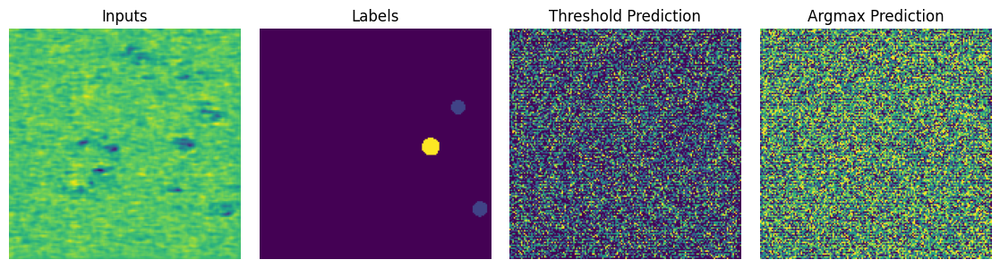

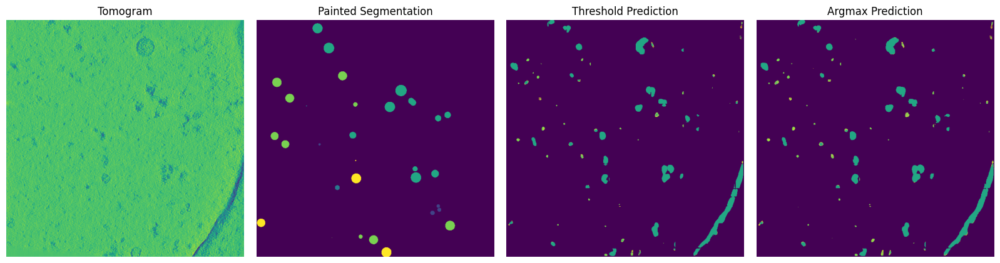

Epoch 1/10000, Train Loss: 0.7657, Val Loss: 0.7615
Val Threshold F beta score: 0.1537, Val Argmax F beta score: 0.1481, Best Threshold Val F beta score: 0.1537, Best Argmax Val F beta score: 0.1481
----------


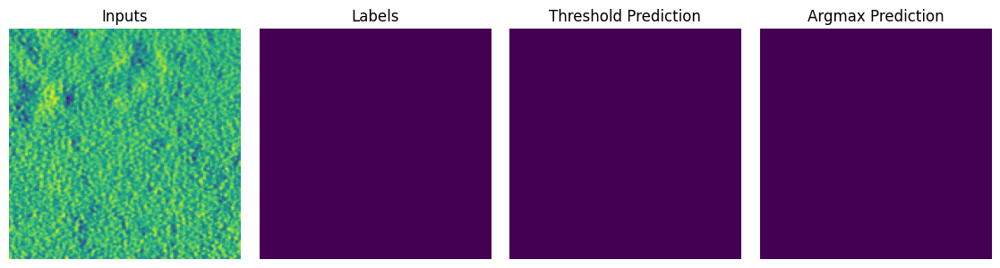

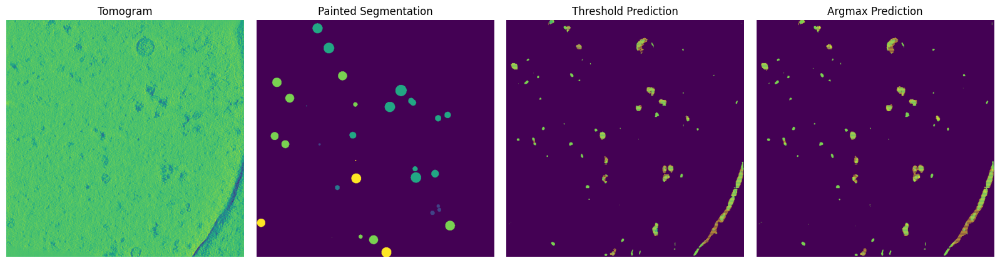

Epoch 2/10000, Train Loss: 0.7353, Val Loss: 0.6961
Val Threshold F beta score: 0.2247, Val Argmax F beta score: 0.2390, Best Threshold Val F beta score: 0.2247, Best Argmax Val F beta score: 0.239
----------


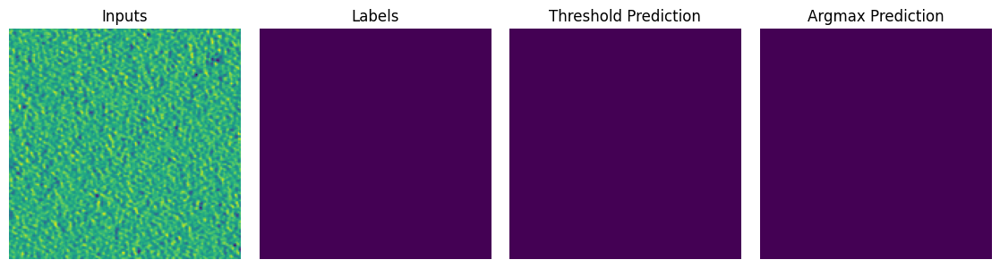

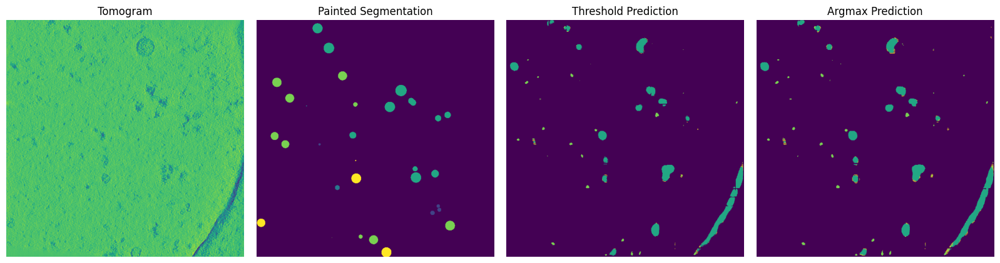

Epoch 3/10000, Train Loss: 0.7277, Val Loss: 0.7383
Val Threshold F beta score: 0.2098, Val Argmax F beta score: 0.2131, Best Threshold Val F beta score: 0.2247, Best Argmax Val F beta score: 0.239
----------


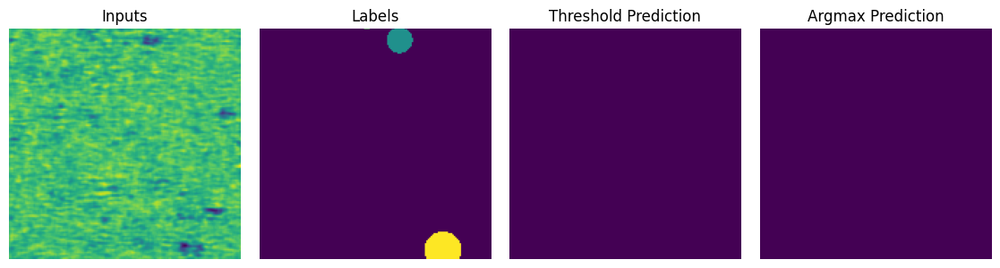

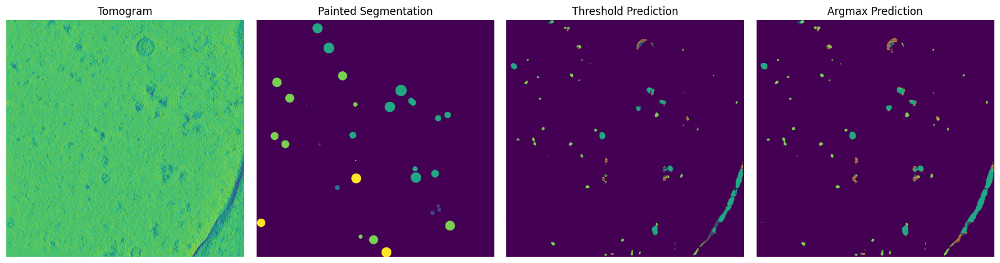

Epoch 4/10000, Train Loss: 0.7198, Val Loss: 0.7086
Val Threshold F beta score: 0.2071, Val Argmax F beta score: 0.2081, Best Threshold Val F beta score: 0.2247, Best Argmax Val F beta score: 0.239
----------


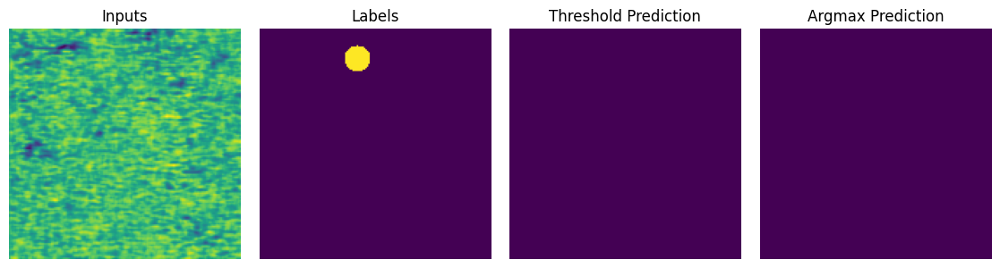

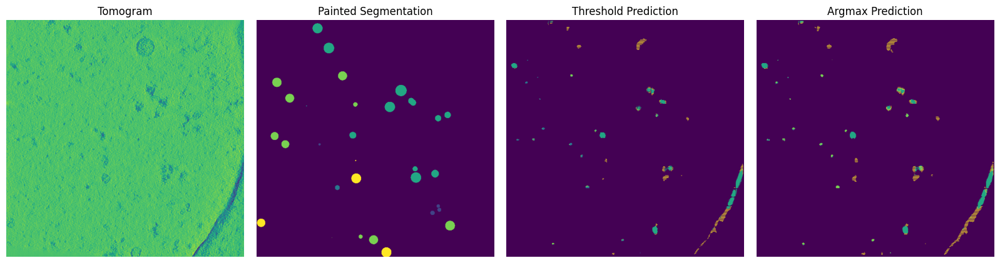

Epoch 5/10000, Train Loss: 0.7125, Val Loss: 0.7022
Val Threshold F beta score: 0.1837, Val Argmax F beta score: 0.2184, Best Threshold Val F beta score: 0.2247, Best Argmax Val F beta score: 0.239
----------


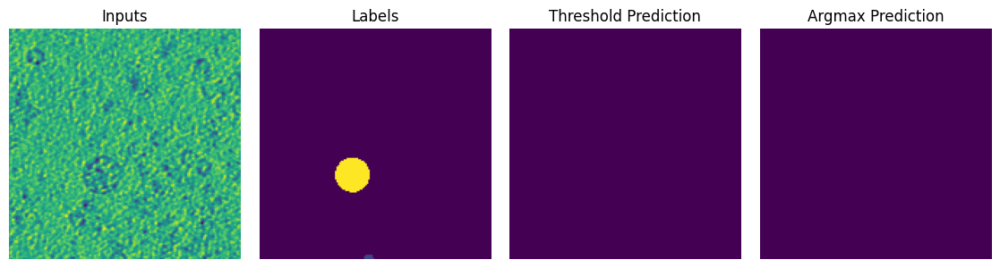

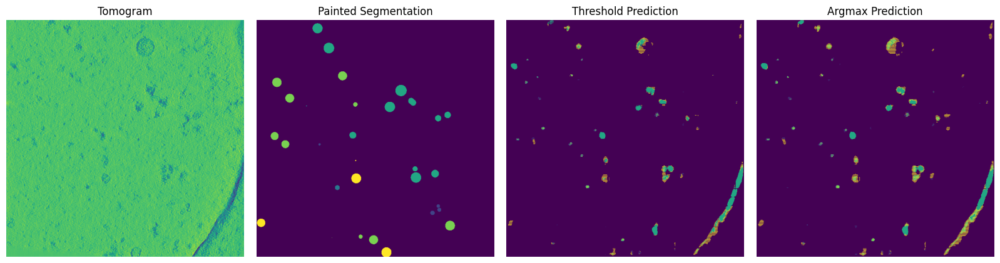

Epoch 6/10000, Train Loss: 0.7024, Val Loss: 0.7107
Val Threshold F beta score: 0.2013, Val Argmax F beta score: 0.2160, Best Threshold Val F beta score: 0.2247, Best Argmax Val F beta score: 0.239
----------


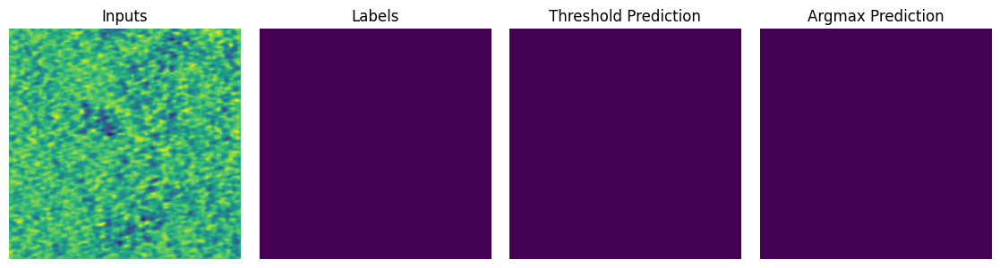

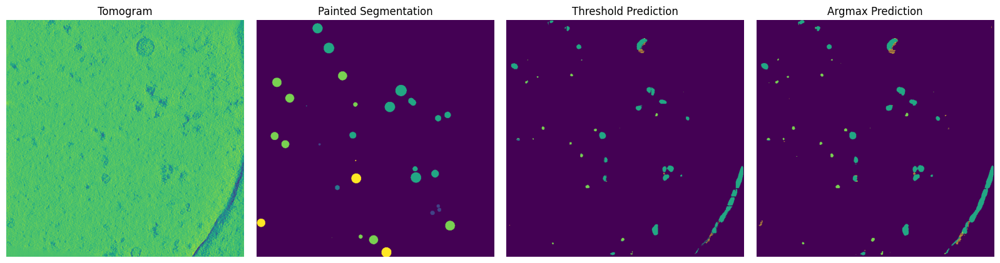

Epoch 7/10000, Train Loss: 0.6979, Val Loss: 0.6976
Val Threshold F beta score: 0.1917, Val Argmax F beta score: 0.2364, Best Threshold Val F beta score: 0.2247, Best Argmax Val F beta score: 0.239
----------


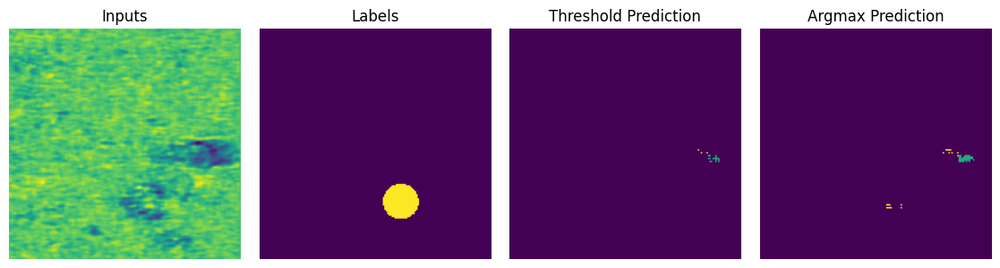

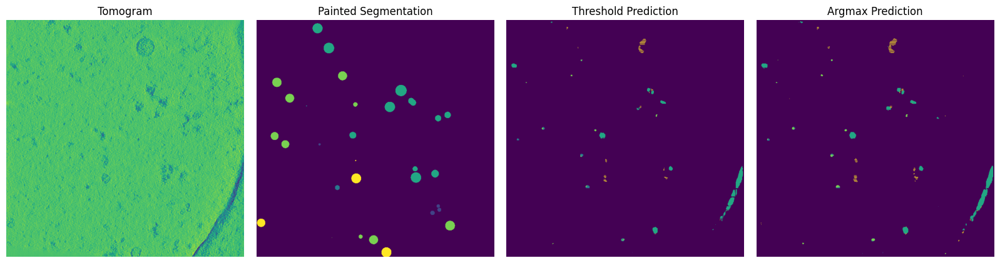

Epoch 8/10000, Train Loss: 0.6799, Val Loss: 0.6566
Val Threshold F beta score: 0.2304, Val Argmax F beta score: 0.3146, Best Threshold Val F beta score: 0.2304, Best Argmax Val F beta score: 0.3146
----------


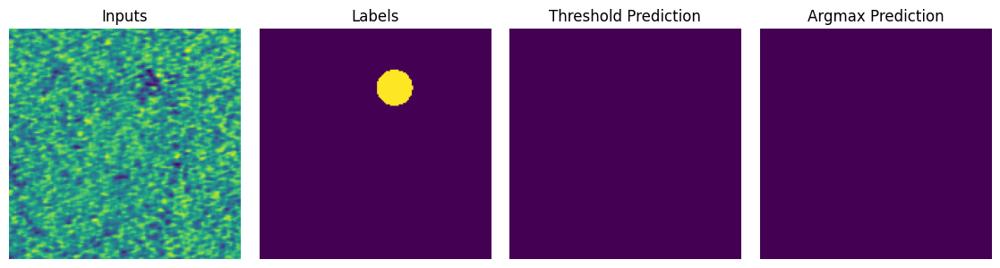

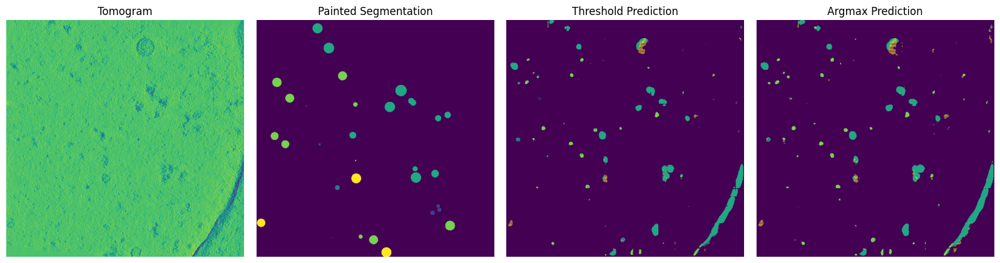

Epoch 9/10000, Train Loss: 0.6660, Val Loss: 0.6749
Val Threshold F beta score: 0.3196, Val Argmax F beta score: 0.3386, Best Threshold Val F beta score: 0.3196, Best Argmax Val F beta score: 0.3386
----------


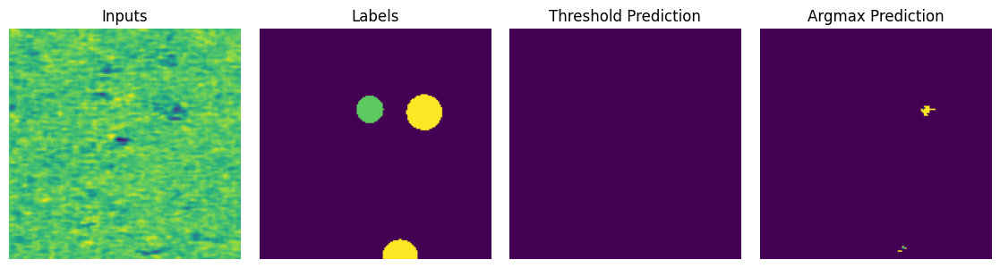

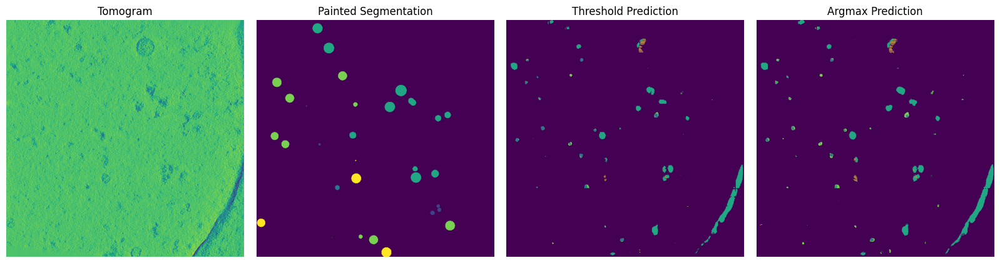

Epoch 10/10000, Train Loss: 0.6543, Val Loss: 0.6578
Val Threshold F beta score: 0.1740, Val Argmax F beta score: 0.2775, Best Threshold Val F beta score: 0.3196, Best Argmax Val F beta score: 0.3386
----------


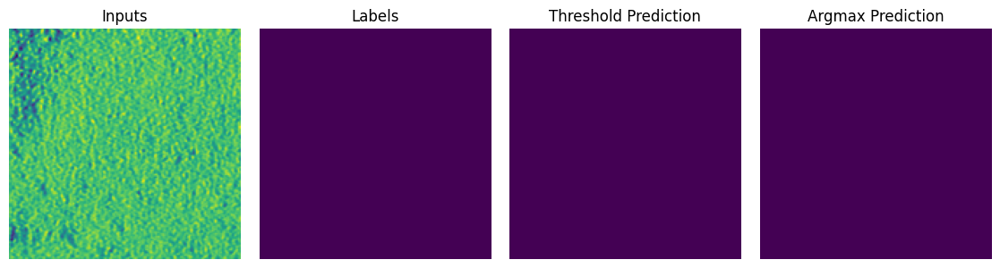

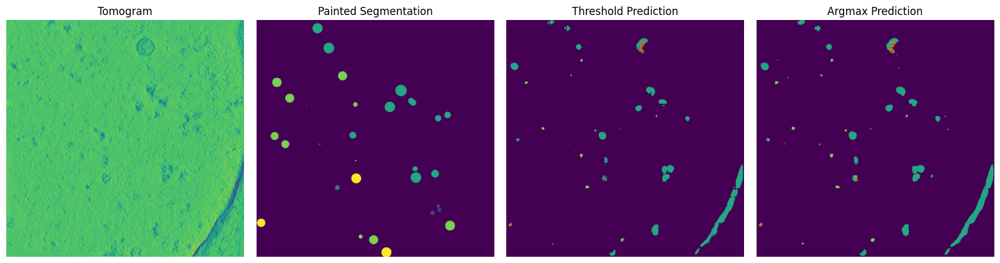

Epoch 11/10000, Train Loss: 0.6225, Val Loss: 0.6553
Val Threshold F beta score: 0.1891, Val Argmax F beta score: 0.2094, Best Threshold Val F beta score: 0.3196, Best Argmax Val F beta score: 0.3386
----------


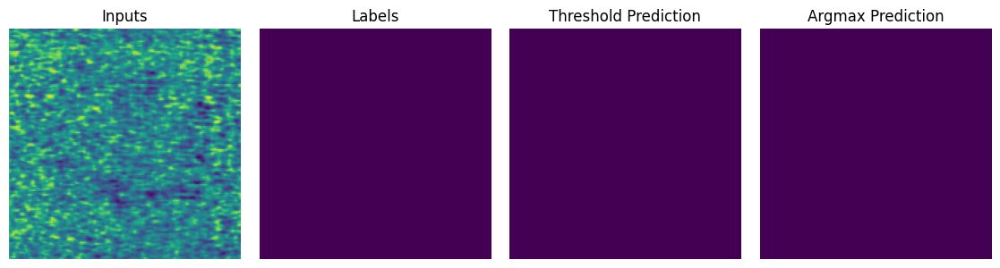

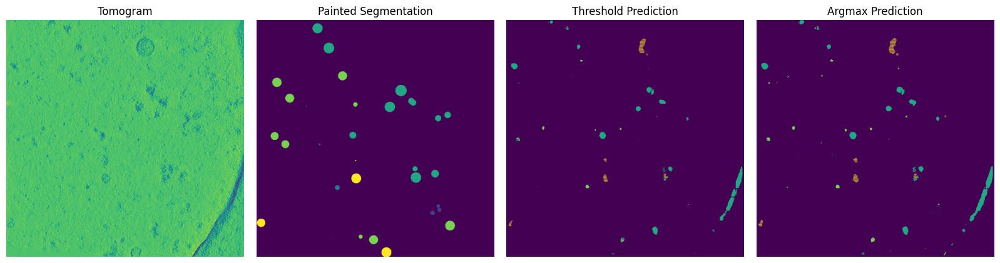

Epoch 12/10000, Train Loss: 0.6058, Val Loss: 0.6349
Val Threshold F beta score: 0.2476, Val Argmax F beta score: 0.3048, Best Threshold Val F beta score: 0.3196, Best Argmax Val F beta score: 0.3386
----------


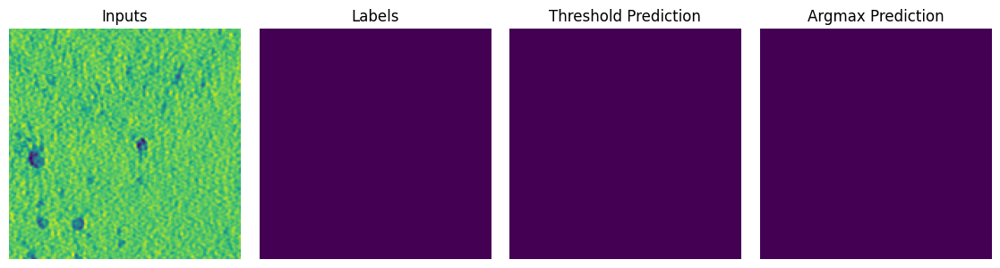

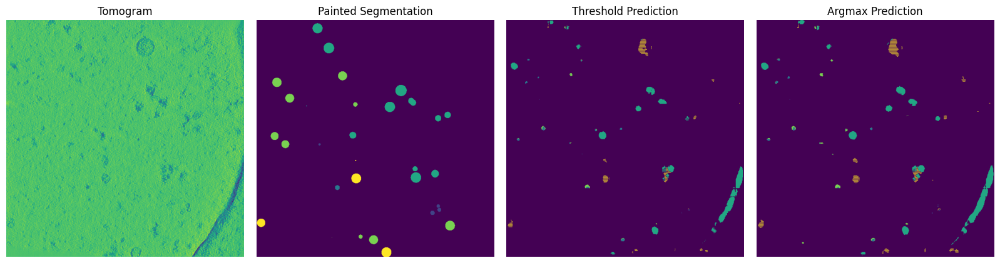

Epoch 13/10000, Train Loss: 0.5854, Val Loss: 0.6496
Val Threshold F beta score: 0.3288, Val Argmax F beta score: 0.4072, Best Threshold Val F beta score: 0.3288, Best Argmax Val F beta score: 0.4072
----------


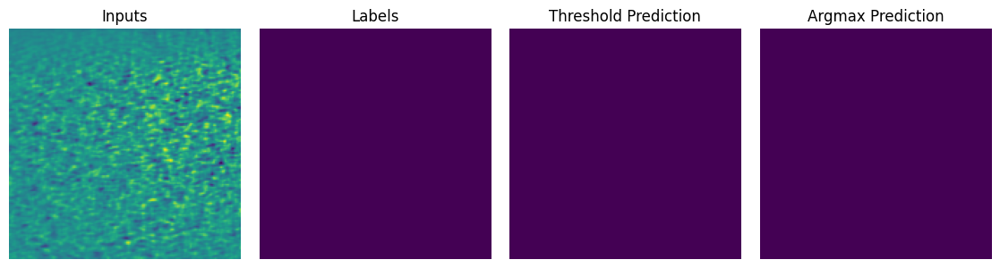

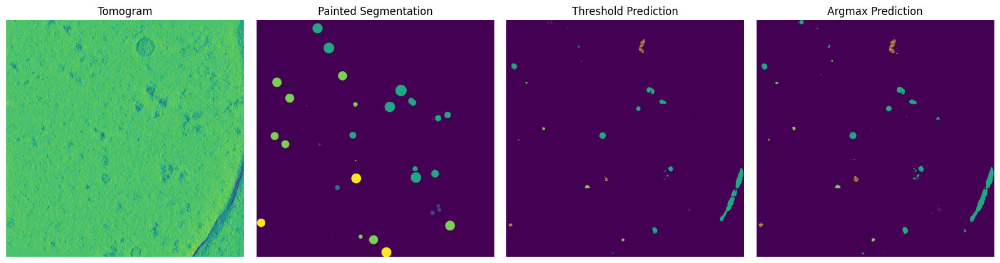

Epoch 14/10000, Train Loss: 0.5670, Val Loss: 0.6055
Val Threshold F beta score: 0.2184, Val Argmax F beta score: 0.2696, Best Threshold Val F beta score: 0.3288, Best Argmax Val F beta score: 0.4072
----------


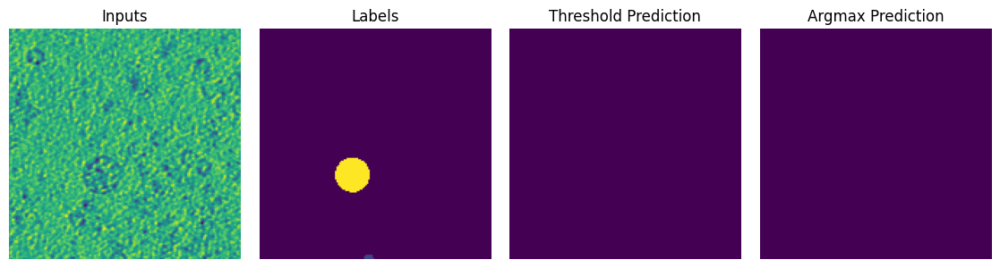

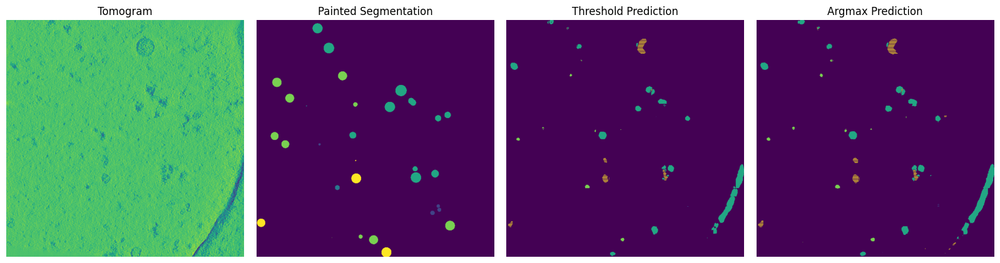

Epoch 15/10000, Train Loss: 0.5297, Val Loss: 0.6105
Val Threshold F beta score: 0.2571, Val Argmax F beta score: 0.2992, Best Threshold Val F beta score: 0.3288, Best Argmax Val F beta score: 0.4072
----------


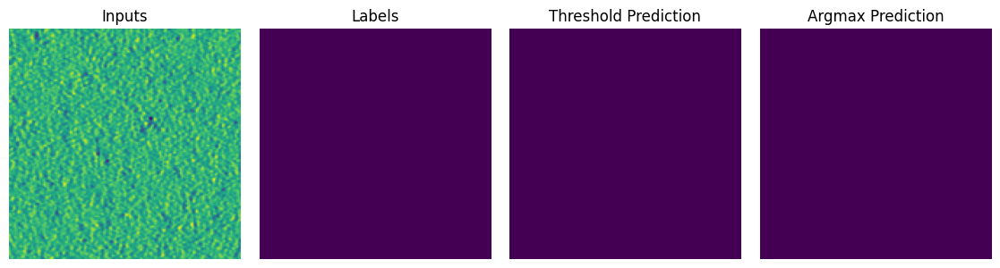

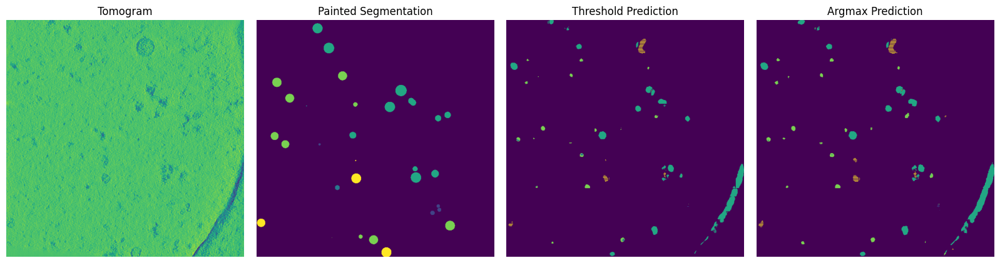

Epoch 16/10000, Train Loss: 0.5246, Val Loss: 0.6131
Val Threshold F beta score: 0.3949, Val Argmax F beta score: 0.4017, Best Threshold Val F beta score: 0.3949, Best Argmax Val F beta score: 0.4072
----------


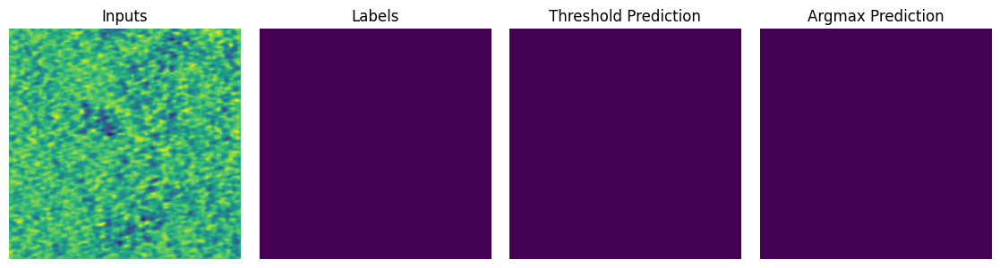

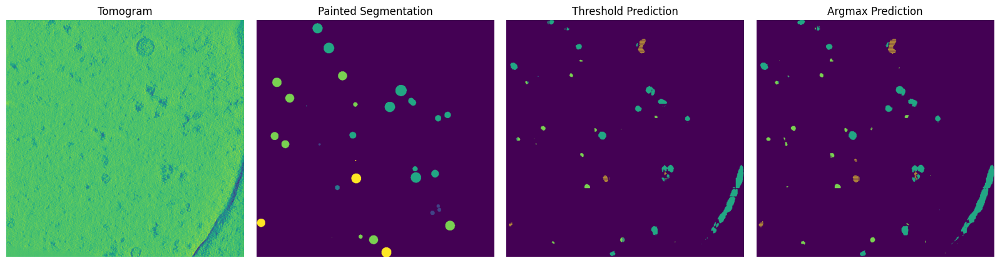

Epoch 17/10000, Train Loss: 0.5008, Val Loss: 0.5762
Val Threshold F beta score: 0.3987, Val Argmax F beta score: 0.3598, Best Threshold Val F beta score: 0.3987, Best Argmax Val F beta score: 0.4072
----------


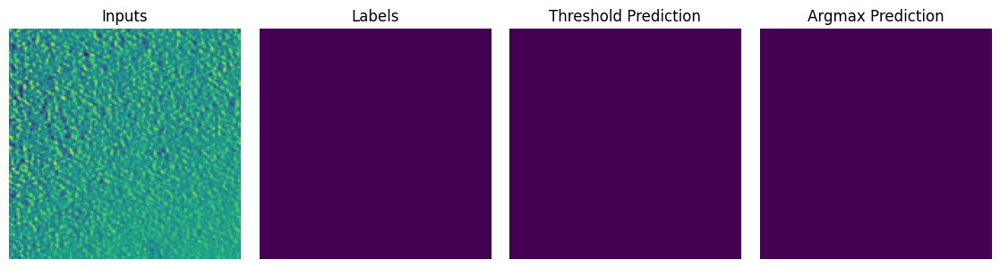

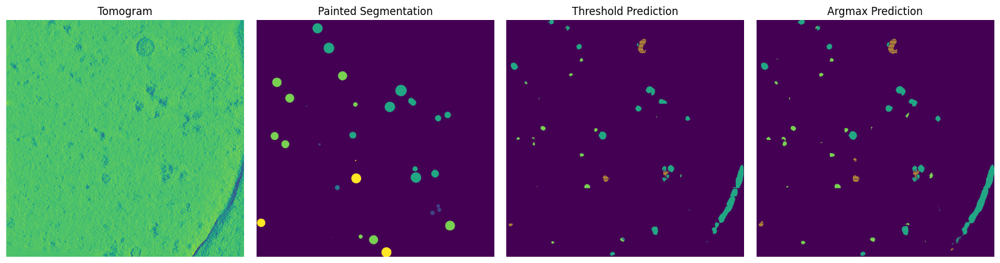

Epoch 18/10000, Train Loss: 0.4890, Val Loss: 0.6141
Val Threshold F beta score: 0.4102, Val Argmax F beta score: 0.4184, Best Threshold Val F beta score: 0.4102, Best Argmax Val F beta score: 0.4184
----------


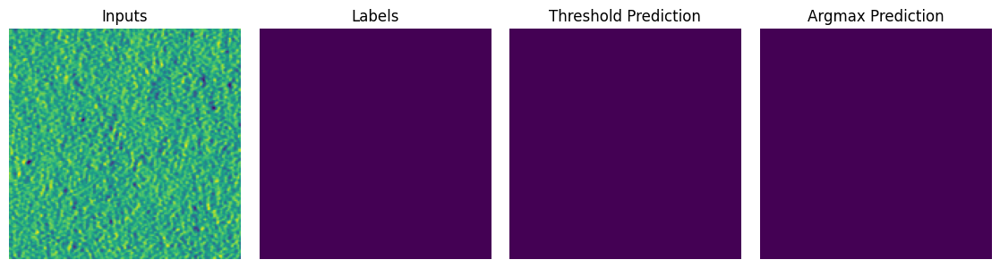

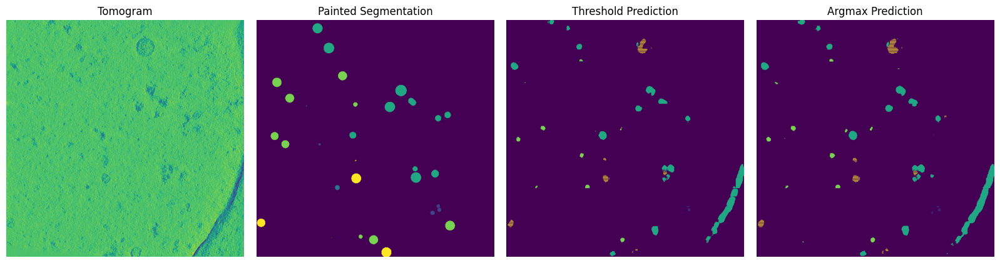

Epoch 19/10000, Train Loss: 0.4718, Val Loss: 0.5296
Val Threshold F beta score: 0.3349, Val Argmax F beta score: 0.3459, Best Threshold Val F beta score: 0.4102, Best Argmax Val F beta score: 0.4184
----------


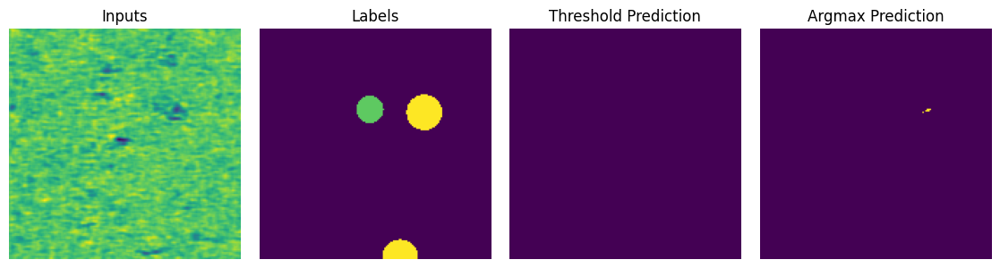

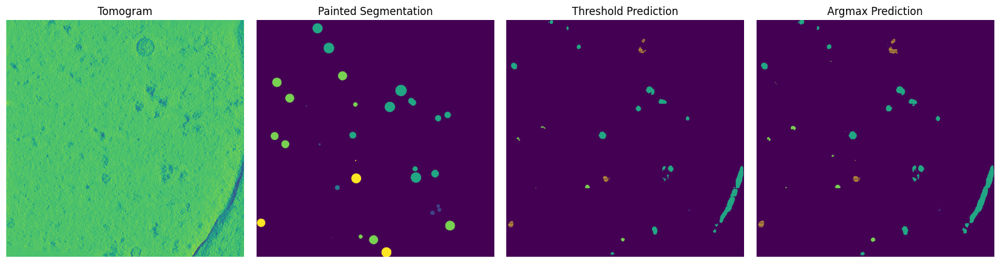

Epoch 20/10000, Train Loss: 0.4622, Val Loss: 0.5494
Val Threshold F beta score: 0.2370, Val Argmax F beta score: 0.2904, Best Threshold Val F beta score: 0.4102, Best Argmax Val F beta score: 0.4184
----------


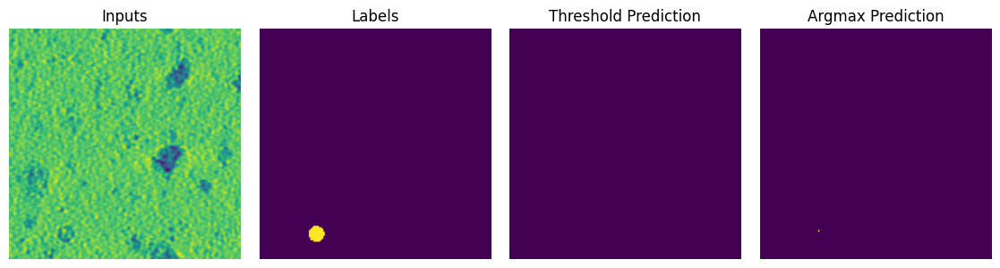

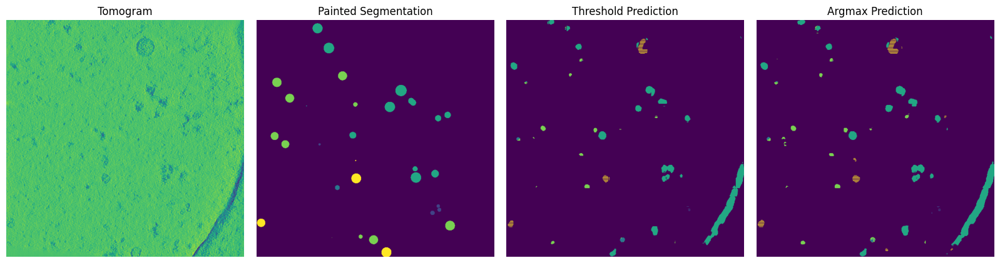

Epoch 21/10000, Train Loss: 0.4598, Val Loss: 0.5907
Val Threshold F beta score: 0.4115, Val Argmax F beta score: 0.4310, Best Threshold Val F beta score: 0.4115, Best Argmax Val F beta score: 0.431
----------


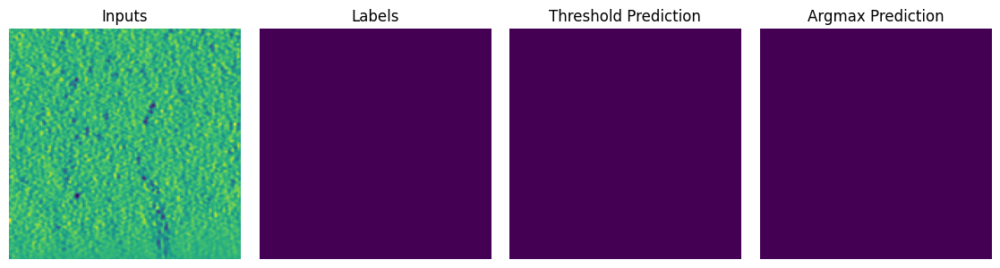

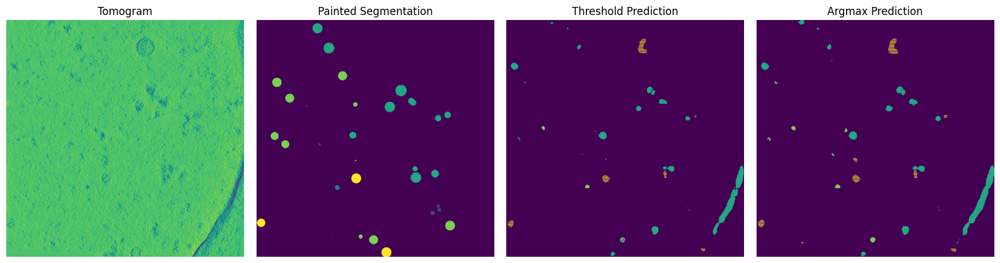

Epoch 22/10000, Train Loss: 0.4343, Val Loss: 0.5293
Val Threshold F beta score: 0.3206, Val Argmax F beta score: 0.3649, Best Threshold Val F beta score: 0.4115, Best Argmax Val F beta score: 0.431
----------


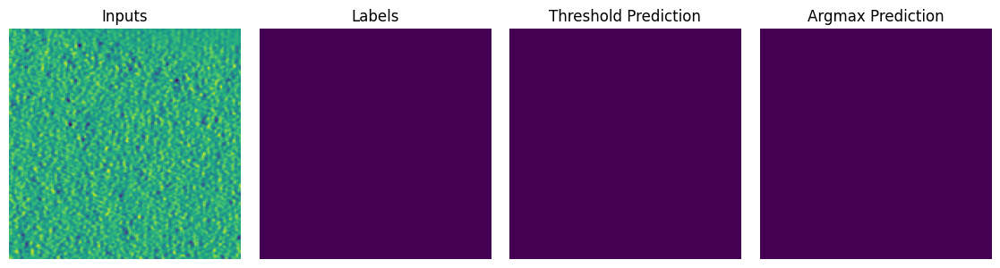

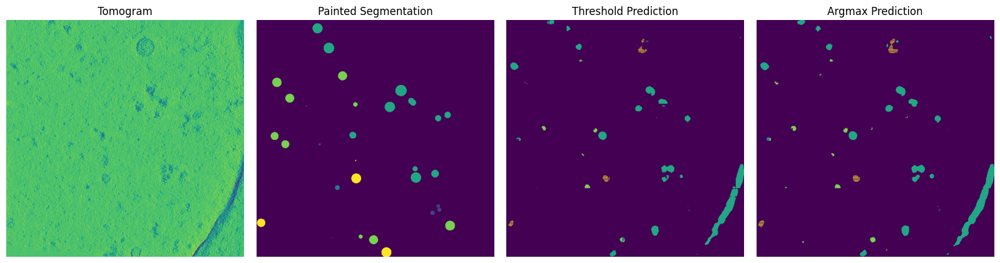

Epoch 23/10000, Train Loss: 0.4329, Val Loss: 0.5851
Val Threshold F beta score: 0.3524, Val Argmax F beta score: 0.3679, Best Threshold Val F beta score: 0.4115, Best Argmax Val F beta score: 0.431
----------


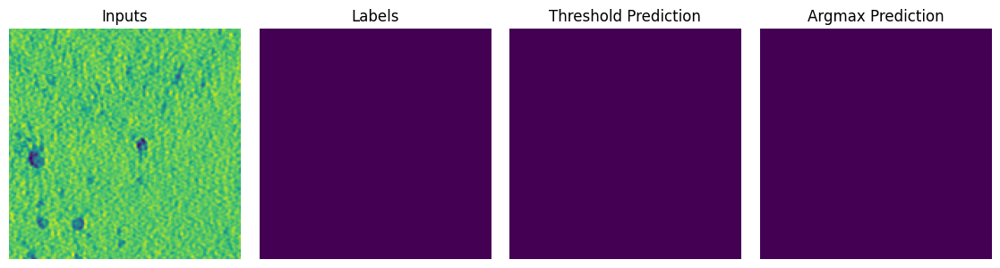

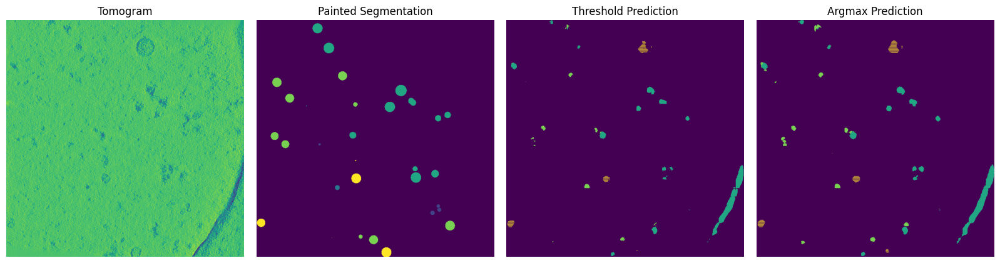

Epoch 24/10000, Train Loss: 0.4108, Val Loss: 0.5953
Val Threshold F beta score: 0.3543, Val Argmax F beta score: 0.3345, Best Threshold Val F beta score: 0.4115, Best Argmax Val F beta score: 0.431
----------


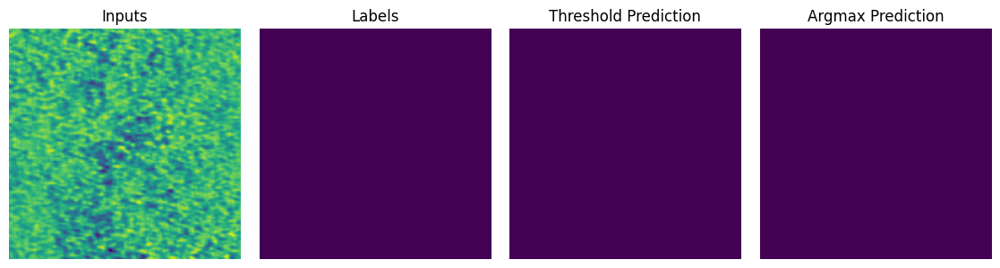

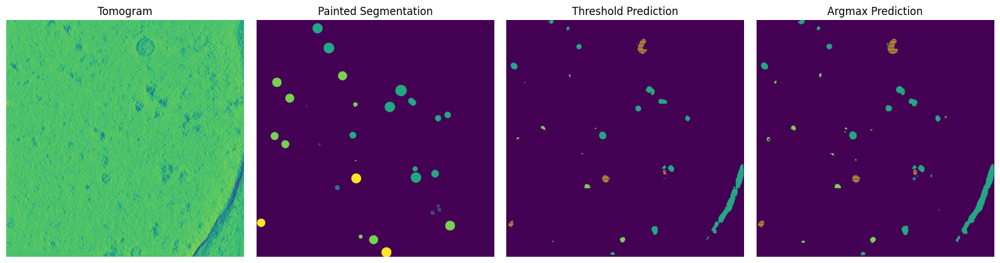

Epoch 25/10000, Train Loss: 0.4263, Val Loss: 0.5977
Val Threshold F beta score: 0.3612, Val Argmax F beta score: 0.3461, Best Threshold Val F beta score: 0.4115, Best Argmax Val F beta score: 0.431
----------


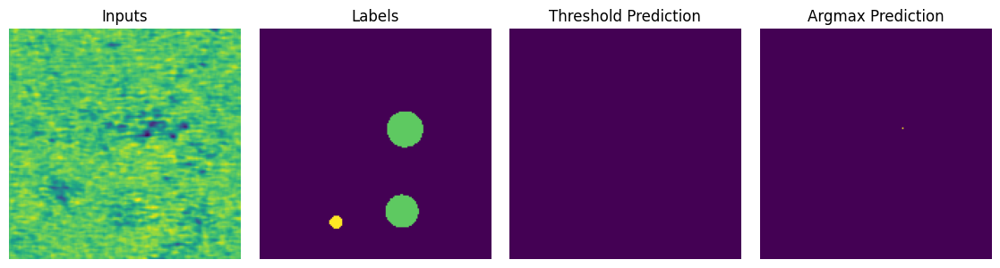

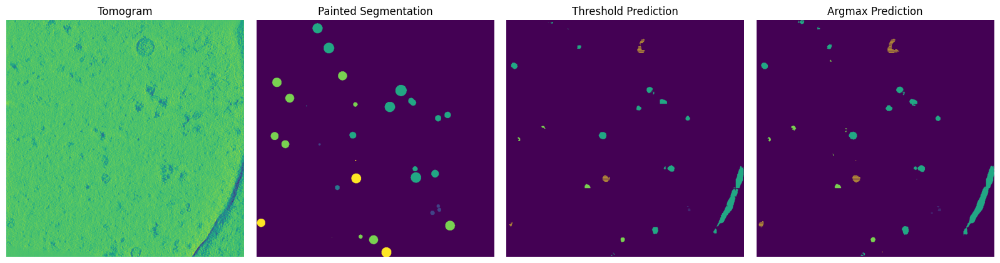

Epoch 26/10000, Train Loss: 0.4022, Val Loss: 0.5285
Val Threshold F beta score: 0.2799, Val Argmax F beta score: 0.3302, Best Threshold Val F beta score: 0.4115, Best Argmax Val F beta score: 0.431
----------


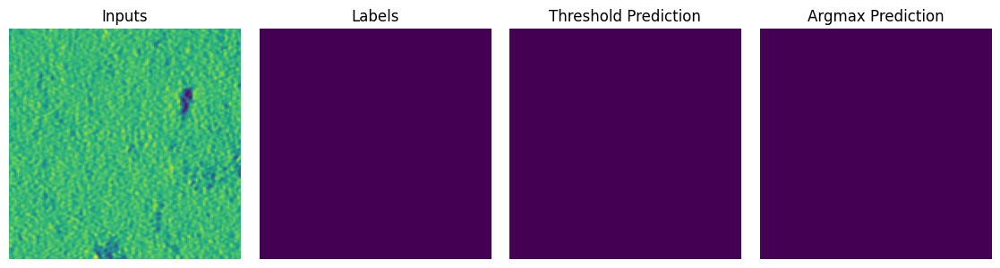

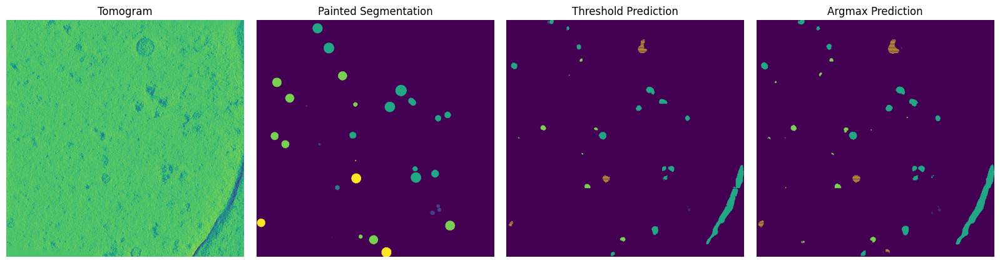

Epoch 27/10000, Train Loss: 0.3859, Val Loss: 0.5925
Val Threshold F beta score: 0.3189, Val Argmax F beta score: 0.3134, Best Threshold Val F beta score: 0.4115, Best Argmax Val F beta score: 0.431
----------


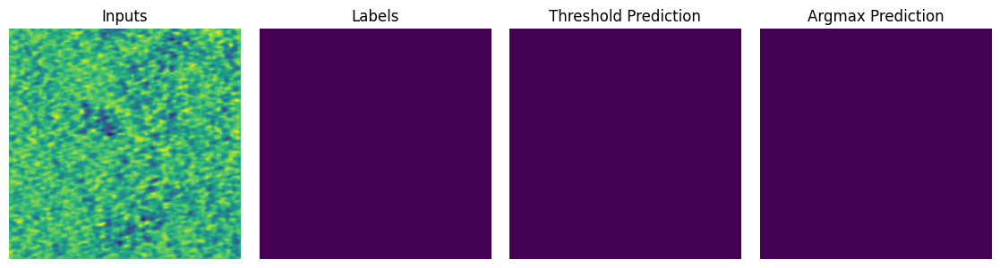

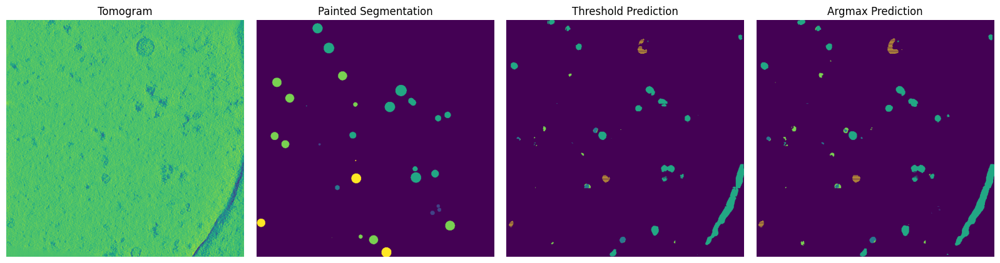

Epoch 28/10000, Train Loss: 0.3789, Val Loss: 0.5550
Val Threshold F beta score: 0.3648, Val Argmax F beta score: 0.4237, Best Threshold Val F beta score: 0.4115, Best Argmax Val F beta score: 0.431
----------


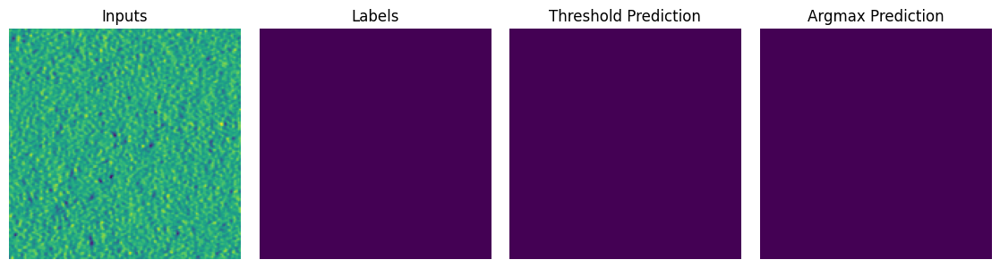

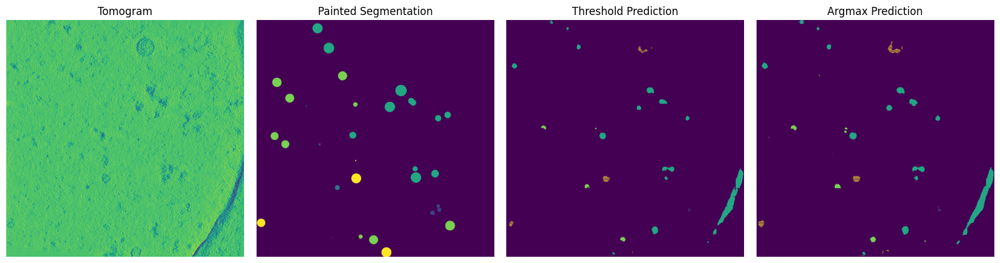

KeyboardInterrupt: 

In [67]:
# Create UNet, DiceLoss and Adam optimizer
model = UNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=num_classes,
    channels=(first_channel_size, first_channel_size*2, first_channel_size*4, first_channel_size*8),
    strides=(2, 2, 2),
    num_res_units=num_res_units,
    dropout=dropout
).to(device)

optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=5e-5)

model.to('cuda')
model = torch.compile(model)

torch.set_float32_matmul_precision('high')

#autocast_dtype = torch.bfloat16

best_val_score = 0
best_argmax_score = 0

max_epochs = 10000

writer = SummaryWriter("runs/experiment1")

early_stopping_count = 0
early_stopping_rounds = 100

best_model = None
best_argmax_model = None

for epoch in range(max_epochs):        
    print("-" * 10)
    model.train()
    epoch_loss = 0
    for batch_idx, batch_data in enumerate(train_loader):
        inputs = batch_data["image"]['data'].to(device, non_blocking=True)
        labels = batch_data["label"]['data'].to(device, non_blocking=True)

        optimizer.zero_grad()

        #with torch.amp.autocast(device_type='cuda', dtype=autocast_dtype):
        outputs = model(inputs)

        if batch_idx == 0:
            fig, axes = plt.subplots(1, 4, figsize=(16*0.7, 4*0.7))  # Adjust figsize to control spacing
            
            first_outputs = outputs[0]
            thresh_probs = first_outputs > prediction_threshold
            _, max_classes = thresh_probs.max(dim=0)
            reconstructed_mask = max_classes.cpu().numpy()

            argmax_tensor = torch.argmax(first_outputs, dim=0)
            argmax_mask = argmax_tensor.cpu().numpy()
    
            # Image 1
            axes[0].imshow(inputs[0][0][0].cpu().numpy())
            axes[0].set_title('Inputs')
            axes[0].axis('off')
            
            # Image 2
            axes[1].imshow(labels[0][0][0].cpu().numpy())
            axes[1].set_title('Labels')
            axes[1].axis('off')
            
            # Image 3
            axes[2].imshow(reconstructed_mask[0])
            axes[2].set_title('Threshold Prediction')
            axes[2].axis('off')
            
            # Image 4
            axes[3].imshow(argmax_mask[0])
            axes[3].set_title('Argmax Prediction')
            axes[3].axis('off')
            
            # Reduce spacing
            plt.subplots_adjust(wspace=0.05)  # Reduce horizontal space between images
            plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)  # Further minimize padding
            
            plt.show()
        
        loss = tversky_loss_function(outputs, labels)

        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()
        
    train_loss = epoch_loss / len(train_loader)

    running_val_loss = 0.0
    
    model.eval()
    with torch.no_grad():
        #with torch.amp.autocast(device_type='cuda', dtype=autocast_dtype):
        for val_batch_idx, batch_data in enumerate(val_loader):
            inputs = batch_data['image'].to(device, non_blocking=True)
            labels = batch_data['label'].to(device, non_blocking=True)

            outputs = model(inputs)
            loss = tversky_loss_function(outputs, labels)

            running_val_loss += loss.item()
        
        solution_dfs_list = []
        submission_dfs_list = []
        argmax_submission_dfs_list = []
        exp_names_list = []

        for first_i in range(len(val_files_copy)):
            val_data = val_files_copy[first_i]

            exp_name = val_data['label_df']['experiment'][0]
            if exp_name in exp_names_list:
                continue
            else:
                exp_names_list.append(exp_name)

            tomo = val_data['image']
            tomo_patches, coordinates = extract_3d_patches_minimal_overlap([tomo], cube_size)
            tomo_patched_data = [{"image": img} for img in tomo_patches]
            tomo_ds = CacheDataset(data=tomo_patched_data, transform=inference_transforms, cache_rate=1.0, progress=False, num_workers=8)
            
            avg_probs_list = []
            for second_i in range(len(tomo_ds)):
                input_tensor = tomo_ds[second_i]['image'].unsqueeze(0).to("cuda", non_blocking=True)
                avg_probs = ensemble_prediction_tta(model, input_tensor)
                avg_probs_list.append(avg_probs.cpu().numpy())

            reconstructed_tensor = reconstruct_prediction_array(avg_probs_list, coordinates, tomo.shape)
            argmax_tensor = torch.argmax(reconstructed_tensor, dim=0)
            thresh_probs = reconstructed_tensor > prediction_threshold
            _, max_classes = thresh_probs.max(dim=0)
            
            reconstructed_mask = max_classes.cpu().numpy()
            argmax_mask = argmax_tensor.cpu().numpy()

            if first_i == 0:
                # Create figure
                fig, axes = plt.subplots(1, 4, figsize=(16, 4))  # Adjust figsize to control spacing
                
                # Image 1
                axes[0].imshow(tomo[100])
                axes[0].set_title('Tomogram')
                axes[0].axis('off')
                
                # Image 2
                axes[1].imshow(val_data['label'][100])
                axes[1].set_title('Painted Segmentation')
                axes[1].axis('off')
                
                # Image 3
                axes[2].imshow(reconstructed_mask[100])
                axes[2].set_title('Threshold Prediction')
                axes[2].axis('off')
                
                # Image 4
                axes[3].imshow(argmax_mask[100])
                axes[3].set_title('Argmax Prediction')
                axes[3].axis('off')
                
                # Reduce spacing
                plt.subplots_adjust(wspace=0.05)  # Reduce horizontal space between images
                plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)  # Further minimize padding
                
                plt.show()
            
            location = {}
            for c in classes:
                cc = cc3d.connected_components(reconstructed_mask == c)
                stats = cc3d.statistics(cc)
                zyx = stats['centroids'][1:]
                zyx_large = zyx[stats['voxel_counts'][1:] > 255]
                xyz = np.ascontiguousarray(zyx_large[:, ::-1])
                location[id_to_name[c]] = xyz
            df = dict_to_df(location, val_data['label_df']['experiment'][0])

            solution_df = val_data['label_df']

            solution_dfs_list.append(solution_df)
            submission_dfs_list.append(df)

            location = {}
            for c in classes:
                cc = cc3d.connected_components(argmax_mask == c)
                stats = cc3d.statistics(cc)
                zyx = stats['centroids'][1:]
                zyx_large = zyx[stats['voxel_counts'][1:] > 255]
                xyz = np.ascontiguousarray(zyx_large[:, ::-1])
                location[id_to_name[c]] = xyz
            df = dict_to_df(location, val_data['label_df']['experiment'][0])
            argmax_submission_dfs_list.append(df)

        solution_concat_df = pd.concat(solution_dfs_list, ignore_index=True).reset_index(drop=True)#.reset_index().rename(columns={'index':'id'})[['id', 'experiment', 'particle_type', 'x', 'y', 'z']]
        submission_concat_df = pd.concat(submission_dfs_list, ignore_index=True).reset_index(drop=True)#.reset_index().rename(columns={'index':'id'})
        argmax_submission_concat_df = pd.concat(argmax_submission_dfs_list, ignore_index=True).reset_index(drop=True)
        
        
        particle_names = ['apo-ferritin', 'beta-galactosidase', 'ribosome', 'thyroglobulin', 'virus-like-particle']
        particle_radius = {
            'apo-ferritin': 65,
            'beta-galactosidase': 95,
            'ribosome': 150,
            'thyroglobulin': 135,
            'virus-like-particle': 145,
        }
        
        val_fbeta_score = score(solution_concat_df, submission_concat_df, 'id', 0.1*0.5, 4)
        
        argmax_val_fbeta_score = score(solution_concat_df, argmax_submission_concat_df, 'id', 0.1*0.5, 4)

        if val_fbeta_score > best_val_score:
            best_val_score = val_fbeta_score
            early_stopping_count = 0
            best_model = copy.deepcopy(model)
            torch.save(best_model.state_dict(), os.path.join(output_path, f"best_threshold_model_{notebook_number}.pth"))

        if argmax_val_fbeta_score > best_argmax_score:
            best_argmax_score = argmax_val_fbeta_score
            early_stopping_count = 0
            best_argmax_model = copy.deepcopy(model)
            torch.save(best_argmax_model.state_dict(), os.path.join(output_path, f"best_argmax_model_{notebook_number}.pth"))
            

    early_stopping_count += 1

    val_loss = running_val_loss / len(val_loader)
    writer.add_scalars("Loss", {"Train": train_loss, "Validation": val_loss}, epoch)

    print(f"Epoch {epoch+1}/{max_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
    print(f"Val Threshold F beta score: {val_fbeta_score:.4f}, Val Argmax F beta score: {argmax_val_fbeta_score:.4f}, Best Threshold Val F beta score: {best_val_score:.4f}, Best Argmax Val F beta score: {best_argmax_score:.4}")

    gc.collect()
    
    if early_stopping_count >= early_stopping_rounds:
        print('Early Stopping Triggered.')
        break

# References

1. https://www.kaggle.com/code/hideyukizushi/czii-yolo11-unet3d-monai-lb-707